In [257]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

shell-init: error retrieving current directory: getcwd: cannot access parent directories: Transport endpoint is not connected
Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-nanum is already the newest version (20180306-3).
0 upgraded, 0 newly installed, 0 to remove and 15 not upgraded.
shell-init: error retrieving current directory: getcwd: cannot access parent directories: Transport endpoint is not connected
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 10 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no s

In [1]:
!pip install konlpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
from wordcloud import WordCloud
from collections import Counter
from konlpy.tag import Okt
from PIL import Image
import re
import time

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

In [4]:
plt.rc('font', family = 'NanumBarunGothic')

# **함수**

In [5]:
def deleting_spc(df, column):
  result = []

  for temp in df[column]:
      kor_str = re.sub(r'[^ㄱ-ㅣ가-힣0-9\s▶]', '', temp)
      kor_str = kor_str.strip()
      result.append(kor_str)

  df[column] = result

  return df

In [6]:
def replacing(texts, word):
  texts = texts.split(' ')

  n_texts = []
  for text in texts:
    if word in text:
      n_text = text.replace(word, '')
      n_texts.append(n_text)
    else:
      n_texts.append(text)

  new_text = ' '.join(n_texts)

  return new_text

In [7]:
# 단어 삭제: 삭제할 단어가 리스트의 형태로 주어지면 이들을 전부 삭제
def replacing_texts(text, words):
  for n in range(len(words)):
    text = replacing(text, words[n])

  return text

In [8]:
def news_preprocessing(df, column, words):
  result1 = []

  for text in df[column]:
    text = replacing_texts(text, words)
    text = text.strip()
    result1.append(text)

  df[column] = result1

  # 기자 이름 삭제
  result2 = []
  for text in df[column]:
    text_list = text.split(' ')
    k = text_list[1:]
    result2.append(' '.join(k))

  df[column] = result2

  # ▶ 뒤의 광고문구 삭제
  result3 = []
  for text in df[column]:
    text_list = text.split('▶')
    t = text_list[0]
    result3.append(t)

  df[column] = result3

  # dates의 object 데이터를 날짜데이터로 전환
  df['dates'] = pd.to_datetime(df['dates'])

  return df

In [9]:
# 금쪽같은 내새끼의 프로그램 이름과 출연진 이름을 제외
def okts_golden(df, column, keyword, i):
    str_list = []
    for temp in df[column]:
        str_list.append(temp)

    str = ''.join(str_list)

    okt = Okt()
    nouns = okt.nouns(str)
    pos = okt.pos(str, stem = True)
    morphs = okt.morphs(str)

    n_words = []
    for n in nouns:
        if len(n) > 1 and n != '금쪽' and n != '오은영' and n != '정형돈' and n != '장영란' and n != '이지현' and n != '홍현희':
            n_words.append(n)

    p_words = []
    for p in pos:
        if len(p[0]) > 1 and 'Adjective' == p[1]:
            p_words.append(p[0])
        elif len(p[0]) > 1 and 'Verb' == p[1]:
            p_words.append(p[0])

    m_words = []
    for m in morphs:
        if len(m) > 1 and m != '금쪽' and m != '오은영' and m != '정형돈' and m != '장영란' and m != '이지현' and m != '홍현희':
            m_words.append(m)


    n_c = Counter(n_words)
    p_c = Counter(p_words)
    m_c = Counter(m_words)
    delete_words = keyword.split(' ')

    for de_word in delete_words:
      del n_c[de_word]
      del p_c[de_word]
      del m_c[de_word]

    temp = sorted(n_c.items(), key = lambda x: x[1], reverse = True)
    n_c = dict(temp[i:])

    temp = sorted(p_c.items(), key = lambda x: x[1], reverse = True)
    p_c = dict(temp[i:])

    temp = sorted(m_c.items(), key = lambda x: x[1], reverse = True)
    m_c = dict(temp[i:])

    return n_c, p_c, m_c

In [10]:
def okts(df, column, keyword, i):
    str_list = []
    for temp in df[column]:
        str_list.append(temp)

    str = ''.join(str_list)

    okt = Okt()
    nouns = okt.nouns(str)
    pos = okt.pos(str, stem = True)
    morphs = okt.morphs(str)

    n_words = []
    for n in nouns:
        if len(n) > 1:
            n_words.append(n)

    p_words = []
    for p in pos:
        if len(p[0]) > 1 and 'Adjective' == p[1]:
            p_words.append(p[0])
        elif len(p[0]) > 1 and 'Verb' == p[1]:
            p_words.append(p[0])

    m_words = []
    for m in morphs:
        if len(m) > 1:
            m_words.append(m)


    n_c = Counter(n_words)
    p_c = Counter(p_words)
    m_c = Counter(m_words)

    delete_words = keyword.split(' ')
    for de_word in delete_words:
      del n_c[de_word]
      del p_c[de_word]
      del m_c[de_word]

    temp = sorted(n_c.items(), key = lambda x: x[1], reverse = True)
    n_c = dict(temp[i:])

    temp = sorted(p_c.items(), key = lambda x: x[1], reverse = True)
    p_c = dict(temp[i:])

    temp = sorted(m_c.items(), key = lambda x: x[1], reverse = True)
    m_c = dict(temp[i:])

    return n_c, p_c, m_c

In [11]:
def okts_return_lists(df, column, keyword):
    str_list = []
    for temp in df[column]:
        str_list.append(temp)

    str = ''.join(str_list)

    okt = Okt()
    nouns = okt.nouns(str)
    pos = okt.pos(str, stem = True)
    morphs = okt.morphs(str)

    n_words = []
    for n in nouns:
        if len(n) > 1 and n != '금쪽' and n != '오은영' and n != '정형돈' and n != '장영란' and n != '이지현' and n != '홍현희':
            n_words.append(n)

    p_words = []
    for p in pos:
        if len(p[0]) > 1 and 'Adjective' == p[1]:
            p_words.append(p[0])
        elif len(p[0]) > 1 and 'Verb' == p[1]:
            p_words.append(p[0])

    m_words = []
    for m in morphs:
        if len(m) > 1 and m != '금쪽' and m != '오은영' and m != '정형돈' and m != '장영란' and m != '이지현' and m != '홍현희':
            m_words.append(m)

    return n_words, p_words, m_words

In [12]:
def get_intersection(dict1, dict2):
  result = {}

  for key1 in list(dict1.keys()):
    for key2 in list(dict2.keys()):
      if key1 == key2:
        if dict1[key1] >= dict2[key2]:
          result[key2] = dict2[key2]
        else:
          result[key1] = dict1[key1]

  return result

In [13]:
def get_difference(list1, list2):
  for text2 in list2:
    if text2 in list1:
      try:
        list1.remove(text2)
      except:
        pass

  return list1

In [14]:
# 교집합 구하기
def make_intersection(df1, df2, keyword1, keyword2, i):
  re_n_words, re_p_words, re_m_words = okts_return_lists(df1, 'description', keyword1)
  n_words, p_words, m_words = okts_return_lists(df2, 'description', keyword2)

  int_n_c = get_intersection(Counter(re_n_words), Counter(n_words))
  int_p_c = get_intersection(Counter(re_p_words), Counter(p_words))
  int_m_c = get_intersection(Counter(re_m_words), Counter(m_words))

  temp = sorted(int_n_c.items(), key = lambda x: x[1], reverse = True)
  int_n_c = dict(temp[i:])

  temp = sorted(int_p_c.items(), key = lambda x: x[1], reverse = True)
  int_p_c = dict(temp[i:])

  temp = sorted(int_m_c.items(), key = lambda x: x[1], reverse = True)
  int_m_c = dict(temp[i:])

  return int_n_c, int_p_c, int_m_c

In [15]:
# 차집합 구하기
def make_difference(df1, df2, keyword1, keyword2, i):
  re_n_words, re_p_words, re_m_words = okts_return_lists(df1, 'description', keyword1)
  n_words, p_words, m_words = okts_return_lists(df2, 'description', keyword2)

  dif_n_words = get_difference(re_n_words, n_words)
  dif_p_words = get_difference(re_p_words, p_words)
  dif_m_words = get_difference(re_m_words, m_words)

  dif_n_c = Counter(dif_n_words)
  dif_p_c = Counter(dif_p_words)
  dif_m_c = Counter(dif_m_words)

  temp = sorted(dif_n_c.items(), key = lambda x: x[1], reverse = True)
  dif_n_c = dict(temp[i:])

  temp = sorted(dif_p_c.items(), key = lambda x: x[1], reverse = True)
  dif_p_c = dict(temp[i:])

  temp = sorted(dif_m_c.items(), key = lambda x: x[1], reverse = True)
  dif_m_c = dict(temp[i:])

  return dif_n_c, dif_p_c, dif_m_c

In [16]:
def wordclouds_gen(c):
    wc = WordCloud(font_path='NanumBarunGothic', width=1000, height=1000, scale=5.0, max_font_size=625, background_color = 'white')
    gen = wc.generate_from_frequencies(c)

    return gen

In [17]:
def wordclouds_one_maker(keyword, c):
  gen = wordclouds_gen(c)
  plt.imshow(gen)
  plt.title(keyword + '에 대한 워드클라우드')
  plt.axis('off')

In [18]:
def wordclouds_maker(keyword, c1, c2, c3):
  gen1 = wordclouds_gen(c1)
  gen2 = wordclouds_gen(c2)
  gen3 = wordclouds_gen(c3)
  gen_list = [gen1, gen2, gen3]

  fig, axes = plt.subplots(1, 3, figsize=(15,10))
  for i, gen in enumerate(gen_list):
    axes[i].imshow(gen)
    axes[i].set_title(keyword + '에 대한 워드클라우드')
    axes[i].axis('off')

In [19]:
f_path = 'drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/'

def save_file_to_csv(df, f_path):
    file_name = input('확장자명을 제외한 파일 이름을 입력하세요: ')
    df.to_csv(os.path.join(f_path, file_name + '.csv'), index = False)
    time.sleep(10)

def save_jpgs(f_path):
  file_name = input('파일 이름을 입력해주세요: ')
  plt.savefig(f_path + file_name + '.jpg')

# **요즘 육아 금쪽같은 내 새끼**

In [20]:
golden_kids = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/[차민수] naver_goldenkids_search.csv')
golden_kids

,Unnamed: 0,titles,dates,description
0,0,"초4 딸 난독증 유전이었나...금쪽 父 ""내 탓"" 눈물 ('금쪽같은 내새끼')",2023.06.16.,\n\n[스포츠조선 조윤선 기자] 금쪽이 아빠가 난독증 진단을 받은 딸을 보며 눈물...
1,1,"이지현 아들, 부쩍 좋아졌다더니…집중해 바둑 두는 인상적 모습",2023.06.12.,"\n\n[스포츠조선 이정혁 기자]부쩍 좋아졌다더니, 실제로 그러한 듯하다. 이지현이..."
2,2,"초3 금쪽이, '등교 거부'로 유급 위기…보다못한 오은영, ""잠깐만요"" 긴급 STOP",2023.06.09.,\n\n[스포츠조선 이정혁 기자]회사에서 엄마를 때리며 난동부리는 '충격' 금쪽이…...
3,3,"""엄마는 금쪽이만 사랑해"" 난간서 울부짖은 형까지…육탄전 형제 문제는? ('금쪽같은...",2023.06.09.,\n\n[스포츠조선닷컴 이게은기자] 등교를 거부하는 금쪽이에 이어 난간에서 홀로 울...
4,4,'금쪽같은 내새끼' 빈방 홀로 울부짖던 금쪽이 형의 '돌발 행동'…스튜디오 '충격',2023.06.09.,\n\n[스포츠조선닷컴 김수현기자] 금쪽이 형의 속마음에 모두가 충격에 빠졌다. 오...
...,...,...,...,...
516,516,"장영란, 신애라 성품+미모에 감탄 “나의 롤모델. 모든 걸 닮고 싶어요”",2020.06.06.,\n\n[스포츠조선닷컴 박아람 기자] 방송인 장영란이 배우 신애라의 성품과 미모에 ...
517,517,"홍현희, '♥제이쓴' 반한 뼈그우먼의 일상…햄버거 주렁주렁달고 '활짝'",2020.06.05.,\n\n이미지 원본보기\n이미지 원본보기\n[스포츠조선닷컴 김수현기자] 개그우먼 홍...
518,518,"[종합]""행복하게 살겠다"" 이연희, 오늘(2일) 비공개 결혼…인생 2막 축하 ing",2020.06.02.,\n\n[스포츠조선닷컴 정안지 기자]배우 이연희가 오늘(2일) 비연예인과 결혼식을 ...
519,519,"[SC이슈]""결혼으로 여는 인생 2막""…이연희, 오늘(2일) 연상 비연예인 연인과 ...",2020.06.02.,"\n\n[스포츠조선 이승미 기자] 배우 이연희(32)가 바로 오늘(2일), 결혼으로..."


In [21]:
# 원본 복사 후 필요없는 column 삭제
golden_kids_df = golden_kids.copy()
golden_kids_df = golden_kids_df.iloc[:, 1:]

In [22]:
golden_kids_df = deleting_spc(golden_kids_df, 'description')

In [23]:
words = ['스포츠조선', '이미지', '원본보기', '닷컴', '기자', '채널', '사진', '출처']
golden_kids_df = news_preprocessing(golden_kids_df, 'description', words)

In [24]:
golden_kids_df.head()

,titles,dates,description
0,"초4 딸 난독증 유전이었나...금쪽 父 ""내 탓"" 눈물 ('금쪽같은 내새끼')",2023-06-16,금쪽이 아빠가 난독증 진단을 받은 딸을 보며 눈물을 흘렸다 오늘16일 금요일 저녁...
1,"이지현 아들, 부쩍 좋아졌다더니…집중해 바둑 두는 인상적 모습",2023-06-12,부쩍 좋아졌다더니 실제로 그러한 듯하다 이지현이 단란한 가족의 행복 근황을 전헀다 ...
2,"초3 금쪽이, '등교 거부'로 유급 위기…보다못한 오은영, ""잠깐만요"" 긴급 STOP",2023-06-09,회사에서 엄마를 때리며 난동부리는 충격 금쪽이오은영의 진단은 수동 공격적 함구증이다...
3,"""엄마는 금쪽이만 사랑해"" 난간서 울부짖은 형까지…육탄전 형제 문제는? ('금쪽같은...",2023-06-09,등교를 거부하는 금쪽이에 이어 난간에서 홀로 울부짖을 수 밖에 없었던 금쪽의 형의 ...
4,'금쪽같은 내새끼' 빈방 홀로 울부짖던 금쪽이 형의 '돌발 행동'…스튜디오 '충격',2023-06-09,금쪽이 형의 속마음에 모두가 충격에 빠졌다 오늘9일 저녁 8시 요즘 육아 금쪽같...


In [ ]:
n_c, p_c, m_c = okts_golden(golden_kids_df, 'description', '금쪽이', 20)

파일 이름을 입력해주세요: GoldenWordCloud_3


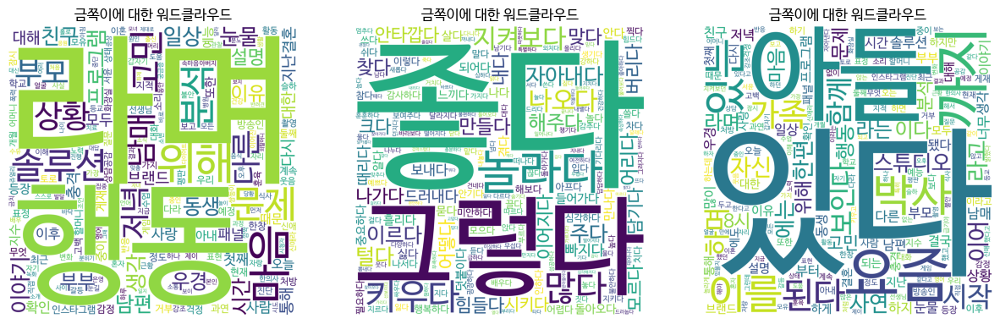

In [ ]:
wordclouds_maker('금쪽이', n_c, p_c, m_c)
save_jpgs(f_path)

**날짜 기준으로 쪼개기**

In [ ]:
golden_kids_2020 = golden_kids_df[golden_kids_df['dates'] < '2021-01-01']
golden_kids_2021 = golden_kids_df[golden_kids_df['dates'].between('2021-01-01', '2021-12-31')]
golden_kids_2022 = golden_kids_df[golden_kids_df['dates'].between('2022-01-01', '2022-12-31')]
golden_kids_2023 = golden_kids_df[golden_kids_df['dates'] >= '2023-01-01']

In [ ]:
# 행의 개수
print(len(golden_kids_2020))
print(len(golden_kids_2021))
print(len(golden_kids_2022))

72
101
243


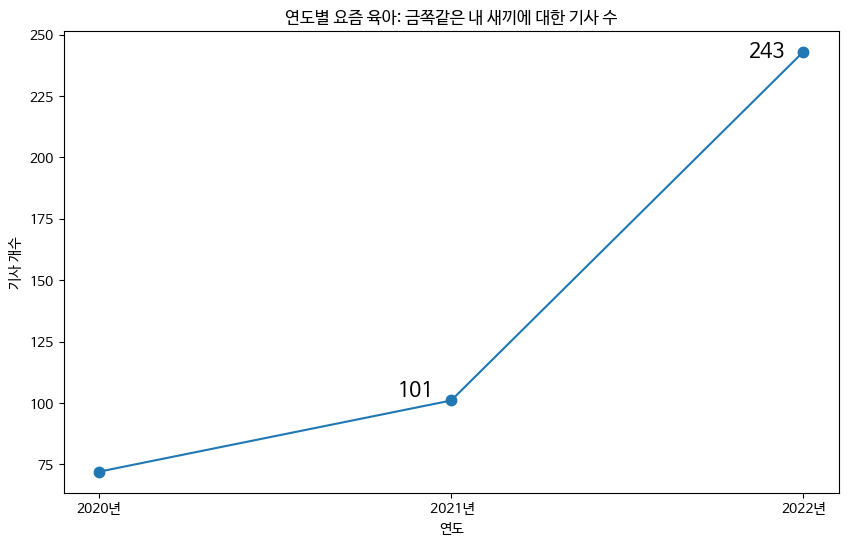

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

ax.plot(['2020년', ' 2021년', '2022년'], [len(golden_kids_2020), len(golden_kids_2021), len(golden_kids_2022)], '.-', ms = 15)
ax.set(title = '연도별 요즘 육아: 금쪽같은 내 새끼에 대한 기사 수', xlabel='연도',ylabel='기사 개수')
ax.text(0.95, len(golden_kids_2021)+2, len(golden_kids_2021), horizontalalignment='right', size=15)
ax.text(1.95, len(golden_kids_2022)-2, len(golden_kids_2022), horizontalalignment='right', size=15)
plt.show()

In [ ]:
golden_kids_2023_3 = golden_kids_df[golden_kids_df['dates'] >= '2023-03-01']

In [ ]:
def compare_by_year(df, years, i):
  n_c, p_c, m_c = okts_golden(df, 'description', '금쪽이', i)
  return wordclouds_maker(str(years) + '금쪽이', n_c, p_c, m_c)

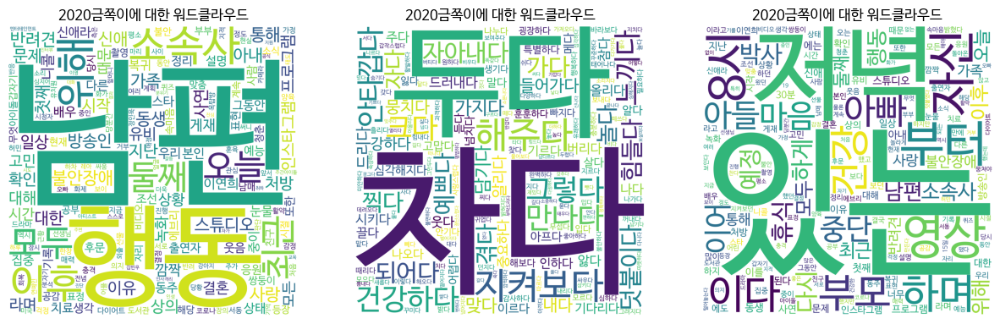

In [ ]:
# 행 개수: 72
compare_by_year(golden_kids_2020, 2020, 25)

주목 키워드 : 불안장애, 문제, 고민, 불안

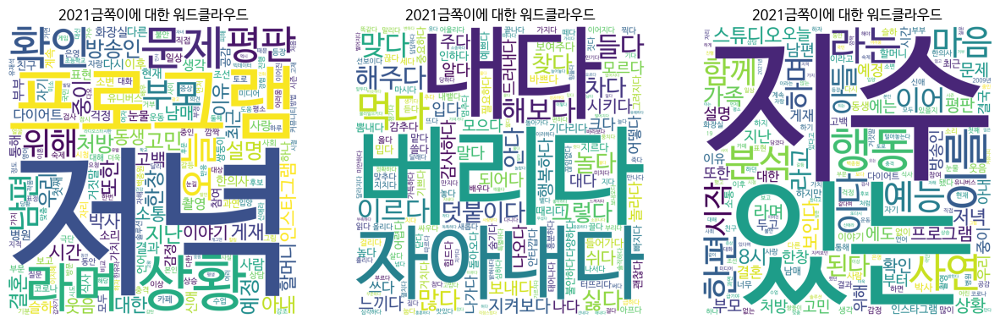

In [ ]:
# 행 개수: 101
compare_by_year(golden_kids_2021, 2021, 25)

주목 키워드 : 고민, 문제

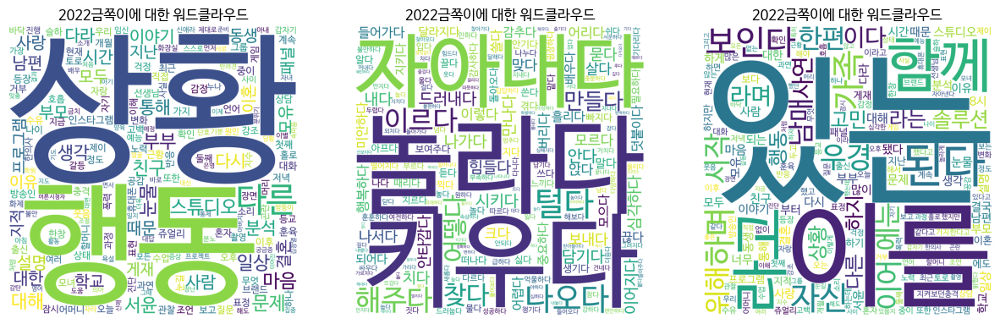

In [ ]:
# 행 개수: 243
compare_by_year(golden_kids_2022, 2022, 25)

주목할만한 점: 기사의 갯수가 작년과 재작년에 비해서 폭발적으로 늘었다.

주목 키워드: 문제, 심각하다,

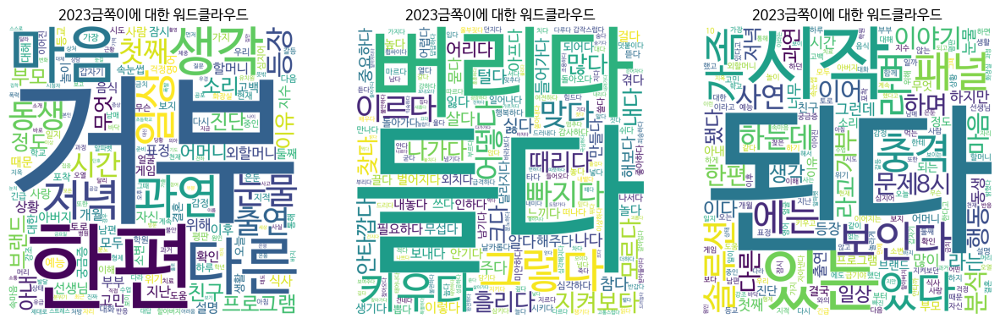

In [ ]:
# 행 개수: 105
compare_by_year(golden_kids_2023, 2023, 25)

주목 키워드 : 거부

2023년과 2020년의 키워드 비교

In [ ]:
n_c, p_c, m_c = okts_golden(golden_kids_2021, 'description', '금쪽이', 0)
print('명사: ', n_c)
print('동사와 형용사: ', p_c)
print('형태소: ', m_c)

명사:  {'엄마': 365, '모습': 156, '육아': 155, '이의': 147, '공개': 137, '새끼': 126, '아이': 120, '출연': 119, '아빠': 116, '요즘': 106, '브랜드': 87, '자신': 80, '영상': 80, '방송': 72, '지수': 72, '행동': 68, '사연': 64, '분석': 62, '한편': 59, '예능': 58, '마음': 57, '시작': 56, '아들': 55, '가족': 52, '스튜디오': 52, '저녁': 49, '프로그램': 47, '상황': 46, '라며': 45, '문제': 44, '확인': 44, '평판': 44, '오늘': 42, '부모': 42, '남편': 41, '위해': 40, '방송인': 39, '지난': 39, '설명': 39, '처방': 39, '고민': 39, '한창': 38, '또한': 38, '중이': 38, '예정': 38, '결혼': 36, '우리': 36, '아내': 36, '게재': 35, '대한': 34, '이유': 34, '시간': 33, '인스타그램': 32, '할머니': 32, '박사': 32, '동생': 32, '고백': 32, '소통': 32, '이야기': 31, '웃음': 31, '최근': 31, '남매': 31, '다이어트': 30, '슬하': 29, '촬영': 29, '사람': 29, '결과': 28, '생각': 27, '통해': 27, '감정': 27, '자기': 26, '신애': 26, '부부': 26, '한의사': 25, '화장실': 25, '사랑': 24, '눈물': 24, '표현': 24, '이후': 24, '다시': 24, '병원': 23, '걱정': 23, '소리': 23, '다른': 23, '현재': 23, '참여': 23, '거짓말': 23, '하나': 22, '계속': 22, '첫째': 22, '공감': 22, '친구': 22, '언어': 22, '식사': 21, '가치': 21, '소변': 20, '모두': 20

In [ ]:
n_c, p_c, m_c = okts_golden(golden_kids_2023, 'description', '금쪽이', 0)
print('명사: ', n_c)
print('동사와 형용사: ', p_c)
print('형태소: ', m_c)

명사:  {'엄마': 529, '이의': 260, '모습': 232, '아빠': 198, '공개': 190, '영상': 184, '방송': 143, '새끼': 141, '육아': 136, '아이': 123, '아들': 122, '박사': 117, '스튜디오': 106, '요즘': 105, '시작': 100, '패널': 93, '충격': 89, '가족': 88, '라며': 83, '솔루션': 74, '사연': 73, '이야기': 68, '문제': 67, '분석': 66, '행동': 62, '거부': 62, '한편': 60, '다른': 60, '마음': 58, '생각': 56, '과연': 55, '저녁': 54, '일상': 53, '눈물': 52, '동생': 52, '출연': 51, '첫째': 50, '등장': 49, '시간': 49, '프로그램': 47, '소리': 47, '이유': 47, '정도': 46, '친구': 45, '브랜드': 45, '진단': 44, '부모': 44, '무엇': 44, '아내': 44, '어머니': 43, '외할머니': 43, '고민': 42, '위해': 42, '표정': 40, '지난': 39, '상황': 38, '지수': 38, '할머니': 38, '모두': 37, '선생님': 37, '개월': 37, '식사': 37, '부부': 36, '설명': 36, '확인': 36, '자신': 36, '이후': 36, '아버지': 36, '때문': 34, '음식': 34, '궁금증': 33, '고백': 33, '놀이': 33, '둘째': 33, '사람': 33, '사랑': 32, '잠시': 32, '결혼': 32, '게임': 32, '소변': 32, '오늘': 31, '생활': 31, '대해': 31, '대한': 31, '영어': 31, '예능': 30, '등교': 30, '속눈썹': 30, '위기': 29, '남편': 29, '토로': 29, '하루': 28, '얼굴': 28, '포착': 28, '가지': 28, '감정': 28, '보지'

In [ ]:
int_n_c, int_p_c, int_m_c = make_intersection(golden_kids_2023, golden_kids_2021, '금쪽이', '금쪽이', 0)
dif_n_c, dif_p_c, dif_m_c = make_difference(golden_kids_2023, golden_kids_2021, '금쪽이', '금쪽이', 0)

print('공통 명사: ', int_n_c)
print('공통 동사와 형용사: ', int_p_c)
print('공통 형태소: ', int_m_c)
print(' ')
print('차이 명사: ', dif_n_c)
print('차이 동사와 형용사: ', dif_p_c)
print('차이 형태소: ', dif_m_c)

공통 명사:  {'엄마': 365, '모습': 156, '이의': 147, '공개': 137, '육아': 136, '새끼': 126, '아이': 120, '아빠': 116, '요즘': 105, '영상': 80, '방송': 72, '사연': 64, '행동': 62, '분석': 62, '한편': 59, '마음': 57, '시작': 56, '아들': 55, '스튜디오': 52, '가족': 52, '출연': 51, '저녁': 49, '프로그램': 47, '라며': 45, '브랜드': 45, '문제': 44, '부모': 42, '위해': 40, '고민': 39, '지난': 39, '상황': 38, '지수': 38, '설명': 36, '확인': 36, '자신': 36, '아내': 36, '이유': 34, '시간': 33, '박사': 32, '고백': 32, '동생': 32, '결혼': 32, '할머니': 32, '오늘': 31, '이야기': 31, '대한': 31, '예능': 30, '사람': 29, '남편': 29, '생각': 27, '감정': 27, '부부': 26, '평판': 25, '눈물': 24, '사랑': 24, '이후': 24, '다시': 24, '우리': 24, '다른': 23, '소리': 23, '현재': 23, '통해': 23, '걱정': 23, '첫째': 22, '친구': 22, '화장실': 22, '계속': 22, '남매': 22, '식사': 21, '모두': 20, '소변': 20, '일상': 19, '또한': 19, '과연': 19, '자리': 19, '처방': 18, '대화': 17, '대해': 17, '보고': 17, '병원': 17, '토로': 17, '등장': 16, '충격': 16, '중인': 16, '불안': 16, '질문': 16, '최근': 16, '직접': 15, '상담': 15, '솔루션': 15, '수업': 15, '지적': 14, '가지': 14, '이상': 14, '소통': 14, '갈등': 14, '방문': 14, '본인

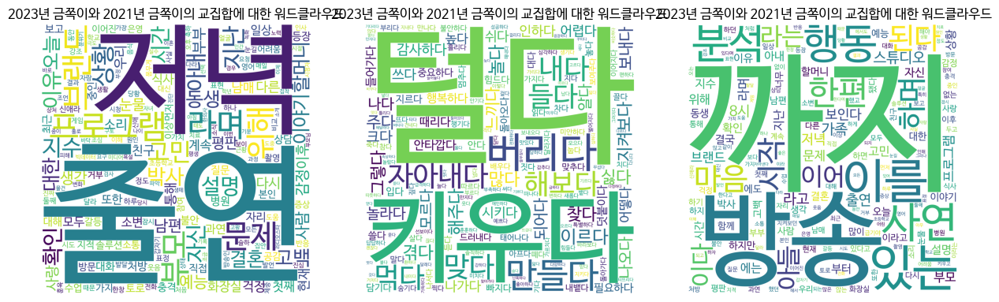

In [ ]:
int_n_c, int_p_c, int_m_c = make_intersection(golden_kids_2023, golden_kids_2021, '금쪽이', '금쪽이', 20)
wordclouds_maker('2023년 금쪽이와 2021년 금쪽이의 교집합', int_n_c, int_p_c, int_m_c)

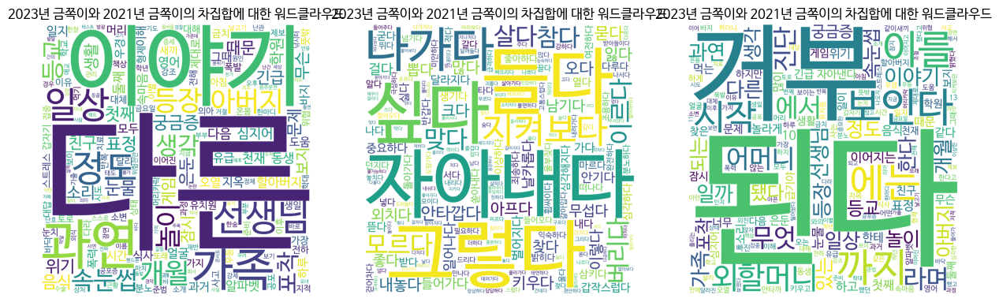

In [ ]:
dif_n_c, dif_p_c, dif_m_c = make_difference(golden_kids_2023, golden_kids_2021, '금쪽이', '금쪽이', 20)
wordclouds_maker('2023년 금쪽이와 2021년 금쪽이의 차집합', dif_n_c, dif_p_c, dif_m_c)

# **우리 아이가 달라졌어요 리턴즈**

In [ ]:
kids_changed_returns = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/[차민수] naver_my_kids_changed_returns_search.csv')
kids_changed_returns

,Unnamed: 0,titles,dates,description
0,0,"아들은 욕하고 엄마는 방에 가두고…""통제보다 마음을 채워줘야""('우아달리턴즈')",2022.12.27.,"\n\n[스포츠조선 백지은 기자] ""유치한 남매싸움같아.""26일 방송된 '우리 아이..."
1,1,엄마에 욕설 퍼붓는 6세 남아..“행복하지 않은 부모에게 자란 아이는 행복할 수 없...,2022.12.27.,\n\n[스포츠조선닷컴 박아람 기자] 전문가들이 엄마에게 욕설을 퍼붓고 심한 폭력성...
2,2,"""아빠 원반 물어와"" 명령…엄마에겐 ""쓸모없어"" 막말하는 6세 '충격' ('우아달 ...",2022.12.26.,"\n\n[스포츠조선 조윤선 기자] 엄마, 아빠를 향한 명령은 기본, 막말까지 서슴지..."
3,3,“늙은 암소! 하늘나라 먼저 가!” 부모에 막말하는 6세 남아..변화할 수 있을까 ...,2022.12.26.,\n\n[스포츠조선닷컴 박아람 기자] SBS플러스 '우리 아이가 달라졌어요 리턴즈'...
4,4,"부모도 포기한 '싫어병' 끝판왕, 전문가 ""저런 행동은 도발""('우아달 리턴즈')",2022.12.25.,\n\n[스포츠조선 백지은 기자] 엄마를 향한 6세 아이의 폭력성은 왜 생긴 걸까....
...,...,...,...,...
80,80,"6세 아이에게 밤마다 찾아오는 공포..전문가 ""30년 간 본 적 없는 패턴"" ('우...",2022.10.09.,"\n\n[스포츠조선 조윤선 기자] 육아 예능 레전드의 귀환, SBS플러스 '우리 아..."
81,81,"[SC현장] ""'어벤저스' 전문의만 모셔왔다""...'우아달 리턴즈', 원조 육아 예...",2022.10.06.,\n\n[스포츠조선 안소윤 기자] '우리 아이가 달라졌어요 리턴즈'가 원조 육아 프...
82,82,"'우아달 리턴즈' 조선미 교수 ""육아 솔루션? 가능한 쉽게 제시하려고 노력""",2022.10.06.,\n\n[스포츠조선 안소윤 기자] '우리 아이가 달라졌어요 리턴즈' 임상심리전문가 ...
83,83,"'우아달 리턴즈' 이양화 제작팀장 ""육아 문제로 고민 중인 부모님多...최근 심각성...",2022.10.06.,\n\n[스포츠조선 안소윤 기자] 이양화 SBS플러스 제작팀장이 '우아달 리턴즈'를...


In [ ]:
kids_changed_returns_df = kids_changed_returns.copy()
kids_changed_returns_df = kids_changed_returns_df.iloc[:, 1:]

In [ ]:
kids_changed_returns_df = deleting_spc(kids_changed_returns_df, 'description')

In [ ]:
words = ['스포츠조선', '이미지', '원본보기', '닷컴', '기자', '채널', '사진', '출처']
kids_changed_returns_df = news_preprocessing(kids_changed_returns_df, 'description', words)

In [ ]:
n_c, p_c, m_c = okts(kids_changed_returns_df, 'description', '우리 아이가 달라졌어요 리턴즈', 10)

파일 이름을 입력해주세요: kids_changed_returns


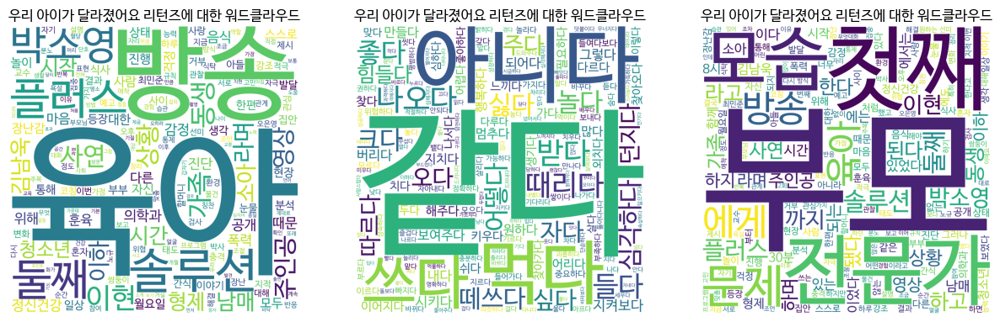

In [ ]:
wordclouds_maker('우리 아이가 달라졌어요 리턴즈', n_c, p_c, m_c)
save_jpgs(f_path)

# **우리 아이가 달라졌어요(2015년 종영)**

In [ ]:
kids_changed = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/[차민수] naver_my_kids_changed_search.csv')
kids_changed.head()

,Unnamed: 0,titles,dates,description
0,0,"우리 아이가 달라졌어요, 역할 바꾼 '요리아빠 VS 놀이아빠' 방송",2015.09.24.,\n\n\n[ SBS 연예스포츠 | 김재윤 선임기자] SBS '우리 아이가 달라졌어...
1,1,"대세는 육아남... 우리 아이가 달라졌어요, '꽃보다 아빠' 특집",2015.09.18.,\n\n\n[ SBS 연예스포츠 | 김재윤 선임기자] SBS '우리 아이가 달라졌어...
2,2,"우리 아이가 달라졌어요, '노래 공포증' 아이의 공포 해소 방법 공개",2015.09.10.,\n\n\n[ SBS 연예스포츠 | 김재윤 선임기자] 11일 방송되는 SBS '우리...
3,3,"우리 아이가 달라졌어요, 대소변 참는 아이 위한 솔루션 공개",2015.08.27.,\n\n\n[ SBS 연예스포츠 | 김재윤 선임기자] 오는 28일 방송되는 SBS ...
4,4,"우리 아이가 달라졌어요, '엄마 껌딱지' 아이들 위한 솔루션 공개",2015.08.07.,\n\n\n[ SBS 연예스포츠 | 김재윤 선임기자] 오늘(7일) 오후 방송 예정인...


In [ ]:
kids_changed_df = kids_changed.copy()
kids_changed_df = kids_changed_df.iloc[:, 1:]

In [ ]:
kids_changed_df = deleting_spc(kids_changed_df, 'description')

In [ ]:
words = ['연예스포츠', '이미지', '원본보기', '닷컴', '선임', '기자', '채널', '사진', '출처', '김재윤']

In [ ]:
n_c, p_c, m_c = okts(kids_changed_df, 'description', '우리 아이가 달라졌어요', 20)

파일 이름을 입력해주세요: kids_changed


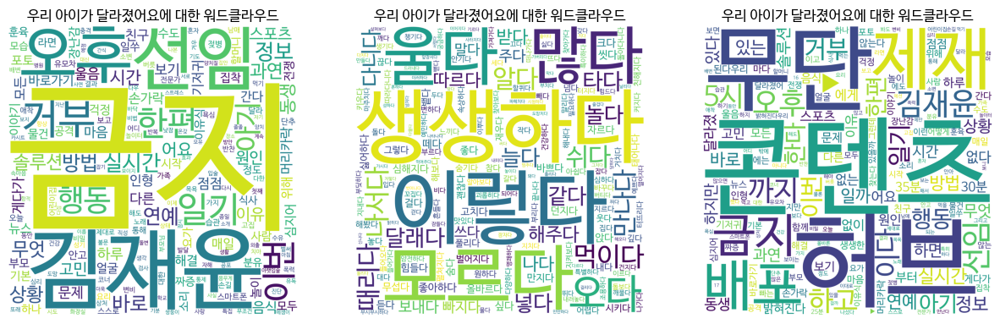

In [ ]:
# 행 개수 : 55개
wordclouds_maker('우리 아이가 달라졌어요', n_c, p_c, m_c)
save_jpgs(f_path)

# 요즘 육아 금쪽같은 내 새끼와 우리 아이가 달라졌어요 키워드 비교

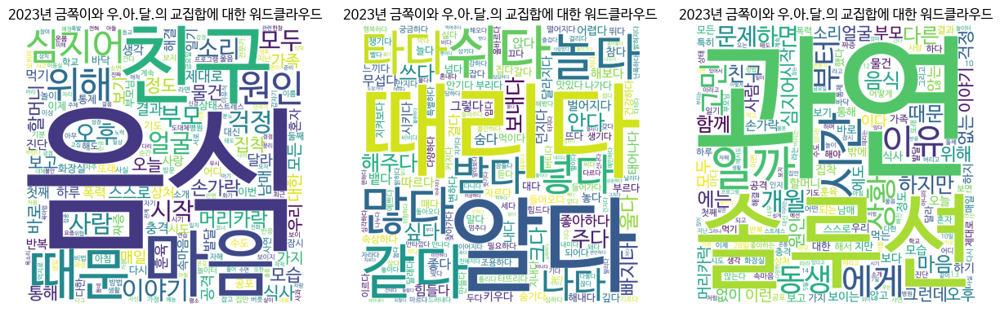

In [ ]:
int_n_c, int_p_c, int_m_c = make_intersection(golden_kids_2023_3, kids_changed_df, '금쪽이', '우리 아이가 달라졌어요', 20)
wordclouds_maker('2023년 금쪽이와 우.아.달.의 교집합', int_n_c, int_p_c, int_m_c)

공통 키워드 중에 주목할만한 키워드

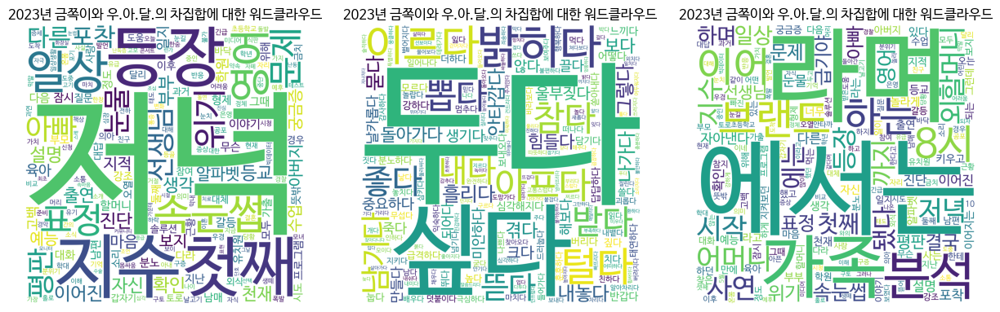

In [ ]:
dif_n_c, dif_p_c, dif_m_c = make_difference(golden_kids_2023_3, kids_changed_df, '금쪽이', '우리 아이가 달라졌어요', 20)
wordclouds_maker('2023년 금쪽이와 우.아.달.의 차집합', dif_n_c, dif_p_c, dif_m_c)

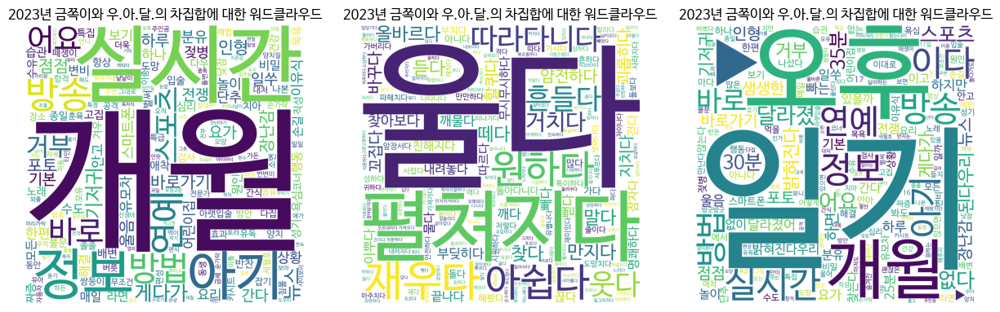

In [ ]:
dif_n_c, dif_p_c, dif_m_c = make_difference(kids_changed_df, golden_kids_2023_3, '우리 아이가 달라졌어요', '금쪽이', 20)
wordclouds_maker('2023년 금쪽이와 우.아.달.의 차집합', dif_n_c, dif_p_c, dif_m_c)

2023년에 방영된 금쪽이가 2015년에 종영된 우.아.달.과 비교할 점

In [ ]:
int_n_c, int_p_c, int_m_c = make_intersection(golden_kids_2023_3, kids_changed_df, '금쪽이', '우리 아이가 달라졌어요', 0)
dif_n_c, dif_p_c, dif_m_c = make_difference(golden_kids_2023_3, kids_changed_df, '금쪽이', '우리 아이가 달라졌어요', 0)

print('공통 명사: ', int_n_c)
print('공통 동사와 형용사: ', int_p_c)
print('공통 형태소: ', int_m_c)
print(' ')
print('차이 명사: ', dif_n_c)
print('차이 동사와 형용사: ', dif_p_c)
print('차이 형태소: ', dif_m_c)

공통 명사:  {'엄마': 210, '아이': 73, '아빠': 72, '육아': 66, '방송': 60, '공개': 56, '행동': 37, '한편': 35, '거부': 32, '무엇': 31, '과연': 30, '솔루션': 30, '시간': 26, '이유': 22, '동생': 22, '상황': 22, '고민': 21, '개월': 18, '문제': 17, '다른': 16, '음식': 16, '친구': 15, '마음': 15, '때문': 15, '심지어': 14, '위해': 14, '원인': 14, '이야기': 13, '얼굴': 13, '걱정': 13, '시작': 12, '모두': 12, '부모': 12, '소리': 12, '오후': 12, '사람': 12, '머리카락': 12, '손가락': 11, '모습': 10, '물건': 10, '정도': 10, '집착': 10, '할머니': 10, '식사': 10, '오늘': 9, '통해': 9, '보고': 9, '바로': 9, '가족': 8, '모든': 8, '대한': 8, '스스로': 8, '보기': 8, '우리': 8, '공격': 7, '매일': 7, '가지': 7, '결과': 7, '남매': 7, '제대로': 7, '달라': 7, '훈육': 7, '첫째': 6, '충격': 6, '하루': 6, '폭력': 6, '먹기': 6, '상처': 6, '혼자': 6, '발달': 6, '해결': 6, '일기': 6, '진단': 5, '반복': 5, '사랑': 5, '생각': 5, '시도': 5, '짜증': 5, '속마음': 5, '화장실': 5, '기도': 5, '공포': 5, '바닥': 5, '상태': 5, '이번': 5, '통제': 5, '다시': 5, '또래': 5, '수도': 5, '다한': 5, '어디': 5, '이제': 5, '부모님': 5, '학교': 4, '소개': 4, '대신': 4, '놀이': 4, '사연': 4, '잠시': 4, '해도': 4, '둘째': 4, '아침': 4, '스트레스': 4, '지난':

# **기사검색: "아이" 정신과**

In [ ]:
kids_psychiatry = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/[차민수] naver_kids_psychiatry_search.csv')

In [ ]:
kids_psychiatry_df = kids_psychiatry.copy()
kids_psychiatry_df = kids_psychiatry_df.iloc[:, 1:]

In [ ]:
kids_psychiatry_df = deleting_spc(kids_psychiatry_df, 'description')
dates = []

for temp in kids_psychiatry_df['dates']:
  temp = temp.strip()
  temp = temp[:11]
  dates.append(temp)

kids_psychiatry_df['dates'] = dates
kids_psychiatry_df

,titles,dates,description
0,정유정은 사이코패스? 단정 대신 '두 번째 충격' 연구해야,2023.06.19.,리뷰 그것이 알고 싶다 그것이 알고 싶다의 한 장면 2023년 5월 26일 ...
1,"[스브스夜] '그알' 전문가, ""살인자 정유정, 섣불리 규정지어선 안돼"" 경고…범행...",2023.06.18.,연예뉴스 김효정 에디터 정유정은 왜 살인자가 되었나17일 방송된 그것이 알고싶다...
2,"""김창옥부터 지나영까지""...일타강사 최종회,'BEST 5' 강연 선정[종합]",2023.06.14.,이미지 원본보기\n분야별 최고의 일타를 모아 강연을 했던 일타강사가 최종회를 맞이해...
3,[가요소식] 임영웅 팬클럽 소아암 등 환아 위해 기부,2023.06.14.,여자아이들 오 마이 갓 2억뷰알렉사 애니 고스트 오브 루인 캐스팅 서울연합뉴스...
4,"'조니 뎁에 패소' 앰버 허드, 은둔 끝 복귀..""여전한 세계최고 미녀 위엄"" [O...",2023.06.13.,최나영 기자 배우 앰버 허드37가 전 남편인 배우 조니 뎁과의 명예훼손 재판 이후 ...
...,...,...,...
664,"'유세풍' 김향기, 시댁 등지고 김민재와 의원의 길 선택 [★밤TV]",2022.08.09.,조선 정신과 의사 유세풍에서 김향기가 김민재를 따라 의원의 길을 선택했다8일 오후 ...
665,"'유세풍' 김향기, 김민재와 구미호 살인사건 해결 ""내 이름으로 살고 싶다"" [종합]",2022.08.09.,이미지 원본보기\n이미지 원본보기\n이미지 원본보기\n이미지 원본보기\n이미지 원본...
666,"'유세풍' 김민재X김향기, 여자아이가 구미호? 사건에 의문 [별별TV]",2022.08.08.,조선 정신과 의사 유세풍에서 김민재와 김향기가 마을 구미호 사건에 대해 의문을 품었...
667,"'유세풍' 정원창, 김향기와 다정한 김민재에 견제 ""구설에 오를 수도""",2022.08.08.,조선 정신과 의사 유세풍에서 정원창과 김민재가 첫 만남을 가졌다8일 오후 방송된 ...


In [ ]:
words = ['연예스포츠', '이미지', '원본보기', '닷컴', '선임', '기자', '채널', '사진', '출처']
kids_psychiatry_df = news_preprocessing(kids_psychiatry_df, 'description', words)
kids_psychiatry_df

,titles,dates,description
0,정유정은 사이코패스? 단정 대신 '두 번째 충격' 연구해야,2023-06-19,그것이 알고 싶다 그것이 알고 싶다의 한 장면 2023년 5월 26일 부산에...
1,"[스브스夜] '그알' 전문가, ""살인자 정유정, 섣불리 규정지어선 안돼"" 경고…범행...",2023-06-18,김효정 에디터 정유정은 왜 살인자가 되었나17일 방송된 그것이 알고싶다이하 그알...
2,"""김창옥부터 지나영까지""...일타강사 최종회,'BEST 5' 강연 선정[종합]",2023-06-14,최고의 일타를 모아 강연을 했던 일타강사가 최종회를 맞이해 5 강사를 선정했다14...
3,[가요소식] 임영웅 팬클럽 소아암 등 환아 위해 기부,2023-06-14,오 마이 갓 2억뷰알렉사 애니 고스트 오브 루인 캐스팅 서울연합뉴스 이태수 ...
4,"'조니 뎁에 패소' 앰버 허드, 은둔 끝 복귀..""여전한 세계최고 미녀 위엄"" [O...",2023-06-13,배우 앰버 허드37가 전 남편인 배우 조니 뎁과의 명예훼손 재판 이후 처음으로 스...
...,...,...,...
664,"'유세풍' 김향기, 시댁 등지고 김민재와 의원의 길 선택 [★밤TV]",2022-08-09,정신과 의사 유세풍에서 김향기가 김민재를 따라 의원의 길을 선택했다8일 오후 방송된...
665,"'유세풍' 김향기, 김민재와 구미호 살인사건 해결 ""내 이름으로 살고 싶다"" [종합]",2022-08-09,시월드와 인연을 끊고 자신의 이름으로 살기로 결심했다8일 오후 방송된 월화드라마 ...
666,"'유세풍' 김민재X김향기, 여자아이가 구미호? 사건에 의문 [별별TV]",2022-08-08,정신과 의사 유세풍에서 김민재와 김향기가 마을 구미호 사건에 대해 의문을 품었다8일...
667,"'유세풍' 정원창, 김향기와 다정한 김민재에 견제 ""구설에 오를 수도""",2022-08-08,정신과 의사 유세풍에서 정원창과 김민재가 첫 만남을 가졌다8일 오후 방송된 월화드...


In [ ]:
n_c, p_c, m_c = okts(kids_psychiatry_df, 'description', '아이 정신과', 20)

파일 이름을 입력해주세요: kids_psychiatry


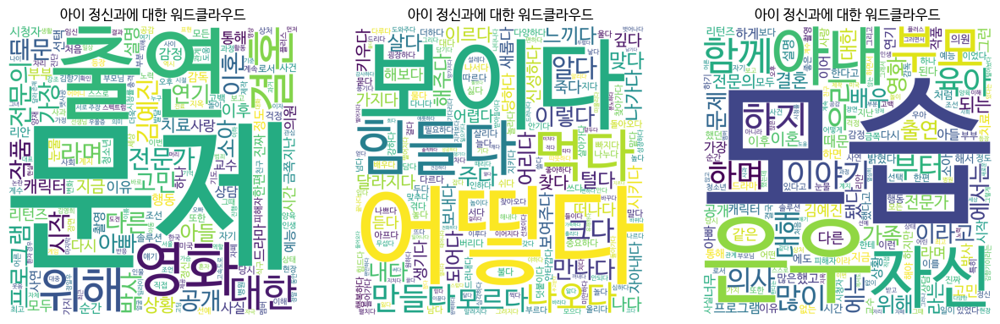

In [ ]:
wordclouds_maker('아이 정신과', n_c, p_c, m_c)
save_jpgs(f_path)

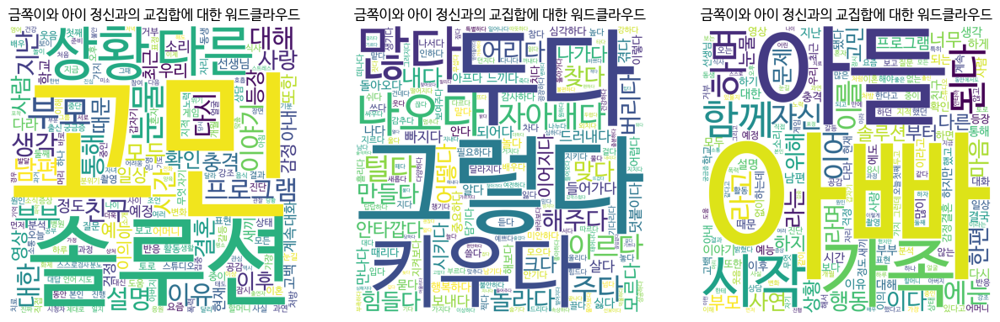

In [ ]:
int_n_c, int_p_c, int_m_c = make_intersection(golden_kids_df, kids_psychiatry_df, '금쪽이', '아이 정신과', 20)
wordclouds_maker('금쪽이와 아이 정신과의 교집합', int_n_c, int_p_c, int_m_c)

금쪽이와 아이 정신과의 공통된 키워드 : 고민, 솔루션, 키우다, 충격

# **카페글 정신과와 금쪽이를 비교**

In [31]:
psychiatry_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/psychiatry.csv')
psychiatry_df = psychiatry_df.dropna()

파일 이름을 입력해주세요: GoldenKids_with_Psychiatry_0


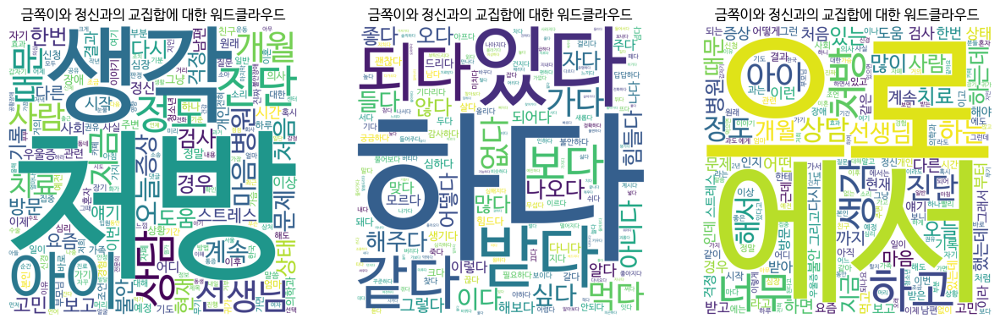

In [ ]:
int_n_c, int_p_c, int_m_c = make_intersection(golden_kids_df, psychiatry_df, '금쪽이', '정신과', 0)
wordclouds_maker('금쪽이와 정신과의 교집합', int_n_c, int_p_c, int_m_c)
save_jpgs(f_path)

키워드 : 처방, 생각, 진단, 상담, 아이, 문제 등등

파일 이름을 입력해주세요: GoldenKids_with_Psychiatry_20


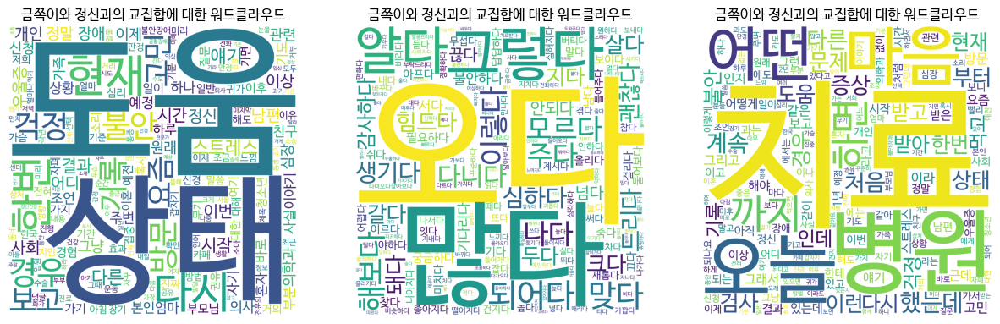

In [ ]:
int_n_c, int_p_c, int_m_c = make_intersection(golden_kids_df, psychiatry_df, '금쪽이', '정신과', 20)
wordclouds_maker('금쪽이와 정신과의 교집합', int_n_c, int_p_c, int_m_c)
save_jpgs(f_path)

명사 주목 키워드 : 도움, 고민, 걱정, 불안, 이상, 조언

동사와 형용사 주목 키워드 : 답답하다, 힘드다, 불안하다

형태소 주목 키워드 : 치료, 증상, 도움

파일 이름을 입력해주세요: GoldenKids_with_Psychiatry_20_nouns


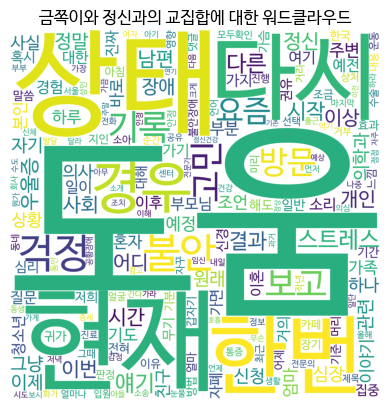

In [ ]:
int_n_c, int_p_c, int_m_c = make_intersection(golden_kids_df, psychiatry_df, '금쪽이', '정신과', 20)
wordclouds_one_maker('금쪽이와 정신과의 교집합', int_n_c)
save_jpgs(f_path)

파일 이름을 입력해주세요: GoldenKids_else_Psychiatry_20


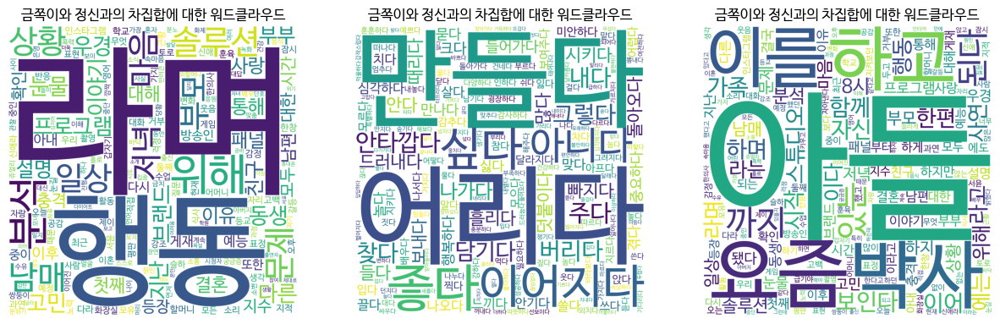

In [ ]:
dif_n_c, dif_p_c, dif_m_c = make_difference(golden_kids_df, psychiatry_df, '금쪽이', '정신과', 20)
wordclouds_maker('금쪽이와 정신과의 차집합', dif_n_c, dif_p_c, dif_m_c)
save_jpgs(f_path)

파일 이름을 입력해주세요: Psychiatry_else_GoldenKids_0


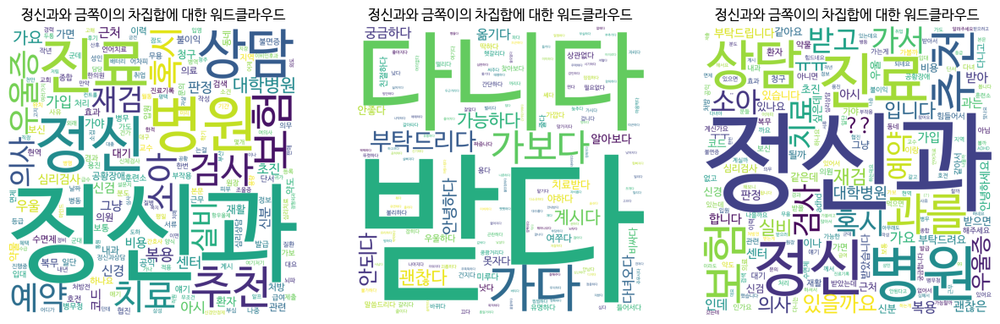

In [ ]:
dif_n_c, dif_p_c, dif_m_c = make_difference(psychiatry_df, golden_kids_df, '정신과', '금쪽이', 0)
wordclouds_maker('정신과와 금쪽이의 차집합', dif_n_c, dif_p_c, dif_m_c)
save_jpgs(f_path)

파일 이름을 입력해주세요: Psychiatry_else_GoldenKids_20


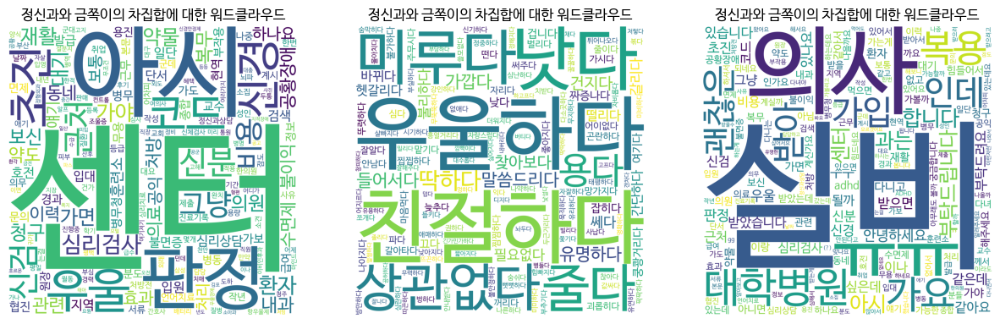

In [ ]:
dif_n_c, dif_p_c, dif_m_c = make_difference(psychiatry_df, golden_kids_df, '정신과', '금쪽이', 20)
wordclouds_maker('정신과와 금쪽이의 차집합', dif_n_c, dif_p_c, dif_m_c)
save_jpgs(f_path)

파일 이름을 입력해주세요: Psychiatry_else_GoldenKids_20_morphs


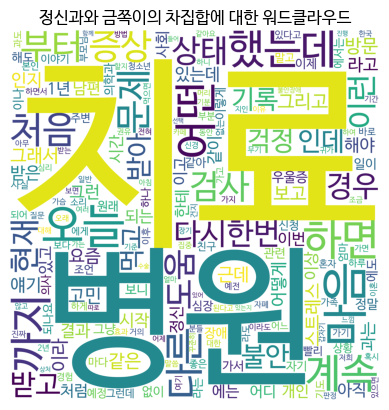

In [ ]:
dif_n_c, dif_p_c, dif_m_c = make_difference(psychiatry_df, golden_kids_df, '정신과', '금쪽이', 20)


파일 이름을 입력해주세요: ★ Psychiatry_else_GoldenKids_20_morphs


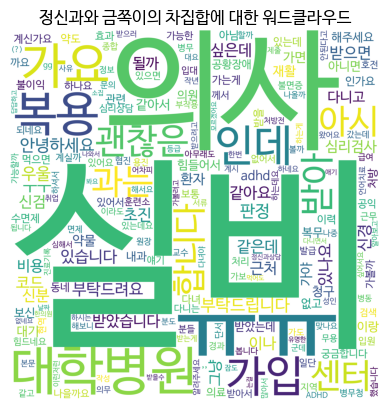

In [ ]:
dif_n_c, dif_p_c, dif_m_c = make_difference(psychiatry_df, golden_kids_df, '정신과', '금쪽이', 20)
wordclouds_one_maker('정신과와 금쪽이의 차집합', dif_m_c)
save_jpgs(f_path)

실비 : 비용, 보험 등등

초진 : 처음 가는 사람이 많은걸까? >> 불이익 키워드와 연계 가능?

요즘 육아 금쪽같은 내새끼의 사연들과 정신과에 관한 카페글들의 공통점으로는 ***도움, 고민, 걱정, 불안*** 등이 있었다. 이는 요즘 육아 금쪽같은 내새끼에 대한 기사가 2022년 들어 폭발적으로 늘어난 것과 연관지어 생각하면 이런 아이의 정신건강에 대한 관심이 높아졌음을 유추할 수 있다고 본다.

정신과와 금쪽이에 대한 차집합으로 유추할 수 있는 것은, ***초진과 불이익***, 그리고 ***실비***라는 키워드로 정신과 진료 기록과 관련된 불이익에 대한 걱정과 비용문제에 대한 걱정이 있다는 점을 유추할 수 있다고 본다.

In [ ]:
psychiatry_df

,title,description,link
0,심리상담센터후 정신과치료??,친구 사귀는것도 힘들어 보이구요 심리센터 상담했고 정신과에 한번 가볼려고 해요 혹시...,http://cafe.naver.com/009955/6868
1,정신과 다니는 분 계신가요 ㅜㅜ,수급자 재심사 때문에 다니는 정신과에서 근로능력평가 진단서랑 진료기록을 뗐어요 그 ...,http://cafe.naver.com/cafe1535/1120544
2,정신과 보험가입 알아보려고요,저희 동생이 주기적으로 정신과 병원가서 약을 타먹는데 한참을 기다려야 겨우 의사선생...,http://cafe.naver.com/uccplus/2091880
3,정신과 치료 4년차인 대학(휴학)생입니다,"부모님께 정신과를 가고 싶다고 말씀드렸지만, 부모님이 보험 가입 거절과 취업 시 불...",http://cafe.naver.com/koreanmania/643861
4,정신과 약 먹어도 될까요?,수술병원 비뇨기과에서 정신과 협진으로 우울증 약 “멀타핀정75밀리그램(미르타자핀)”...,http://cafe.naver.com/tlswkd/378578
...,...,...,...
995,정신과 재검 급수예측 부탁드립니다,정신과치료는 2016년때부터 받고 있고 사회복무하다가 증상이 심해져서 재검 받으러 ...,http://cafe.naver.com/webcenter/891378
996,어른이 갈만한 정신과잇을까요?,저희 엄마가 공황장애 증상이잇으신것같은데 이번에는 실신까지 하셔서 아무래도 정신과가...,http://cafe.naver.com/06rkddkwl/1903522
997,초등학생 정신과?,오늘 좀 어이없는 일을 겪어서 아이가 정신적으로 충격먹는 일이 발생하여 아이가 문밖...,http://cafe.naver.com/kunsanbeauty/1076389
998,우울증약 잘듣는 정신과 찾고있어요,제가 지금 너무 위태로운거 같아요 도움받을곳도 없고 안좋은생각만 끈임없이해서요 작년...,http://cafe.naver.com/byungs94/7329025


In [ ]:
psy_df = psychiatry_df.copy()

psy_df['아이 여부'] = psy_df['description'].str.contains('아이')
df = psy_df[psy_df['아이 여부'] == True]
df

,title,description,link,아이 여부
0,심리상담센터후 정신과치료??,친구 사귀는것도 힘들어 보이구요 심리센터 상담했고 정신과에 한번 가볼려고 해요 혹시...,http://cafe.naver.com/009955/6868,True
21,"공황발작이 자꾸 생기는데, 정신과치료는 받기싫고ㅠ 스스로 나으신분 계실까요??",다시 공황장애가 시작되엇어요 정신과약은 아이학폭 이후부터먹기시작했고 증세가 괜찮아질...,http://cafe.naver.com/uvacenter/677326,True
30,즤 여동생이 정신과 전공의인데요,동생이 정신과 레지던트4년차예요 동생이 대학병원에있는데 교수님들한테 물어봤다네요 자...,http://cafe.naver.com/getampethskin/959255,True
31,소아정신과 진료전에 보험 정비 해야하나요?,아이 이것저것 검사해보려고 소아정신과진료보려해요 까페에 이것저것 검색해보는데 보험정...,http://cafe.naver.com/lol2580/1691167,True
33,정신과,친구 괴롭힘으로 힘들어하는 아이에요 아이가 쉬는 시간 전화가 왔네요 힘들다고 조퇴하...,http://cafe.naver.com/jookjeonmom/1373244,True
...,...,...,...,...
946,감정조절 안되는 애아빠 정신과랑 상담치료 받으면 나아질까요???,달라질까요ㅜ 정신과 상담 치료도 하라하고픈데 집나가서 없네요 같이 죽을힘을다해 노력...,http://cafe.naver.com/getampethskin/910083,True
957,자폐 아이를 많이 본 서울내 소아정신과 있을까요,정신과 약물 치료 중입니다 두드러기 올라오는것도 같고 저희가 다니는곳은 대기실에 보...,http://cafe.naver.com/getampethskin/833325,True
963,많이 우울하신 분들 정신과 진료와 상담 꼭 받으세요,"많이 우울하신 분들 정신과 진료와 상담 꼭 받으세요 처음에는 상담받다가 부부 상담,...",http://cafe.naver.com/1msanbu/2923011,True
985,좋은 정신과는 어떻게 찾으면될까요?,아이둘 맘인데 주위에서 우울증이니 정신과 가보라고 해서 가려는데 어떻게찾아야할지요 ...,http://cafe.naver.com/isajime/5214117,True


In [ ]:
re_n_words, re_p_words, re_m_words = okts_return_lists(psy_df, 'description', '정신과')
n_words, p_words, m_words = okts_return_lists(golden_kids_df, 'description', '금쪽이')

In [ ]:
# 차집합 구하기
def make_difference(df1, df2, keyword1, keyword2, i):
  re_n_words, re_p_words, re_m_words = okts_return_lists(df1, 'description', keyword1)
  n_words, p_words, m_words = okts_return_lists(df2, 'description', keyword2)

  dif_n_words = get_difference(re_n_words, n_words)
  dif_p_words = get_difference(re_p_words, p_words)
  dif_m_words = get_difference(re_m_words, m_words)

  dif_n_c = Counter(dif_n_words)
  dif_p_c = Counter(dif_p_words)
  dif_m_c = Counter(dif_m_words)

  temp = sorted(dif_n_c.items(), key = lambda x: x[1], reverse = True)
  dif_n_c = dict(temp[i:])

  temp = sorted(dif_p_c.items(), key = lambda x: x[1], reverse = True)
  dif_p_c = dict(temp[i:])

  temp = sorted(dif_m_c.items(), key = lambda x: x[1], reverse = True)
  dif_m_c = dict(temp[i:])

  return dif_n_c, dif_p_c, dif_m_c

In [ ]:
golden_kids_df.head()

,titles,dates,description
0,"초4 딸 난독증 유전이었나...금쪽 父 ""내 탓"" 눈물 ('금쪽같은 내새끼')",2023-06-16,금쪽이 아빠가 난독증 진단을 받은 딸을 보며 눈물을 흘렸다 오늘16일 금요일 저녁...
1,"이지현 아들, 부쩍 좋아졌다더니…집중해 바둑 두는 인상적 모습",2023-06-12,부쩍 좋아졌다더니 실제로 그러한 듯하다 이지현이 단란한 가족의 행복 근황을 전헀다 ...
2,"초3 금쪽이, '등교 거부'로 유급 위기…보다못한 오은영, ""잠깐만요"" 긴급 STOP",2023-06-09,회사에서 엄마를 때리며 난동부리는 충격 금쪽이오은영의 진단은 수동 공격적 함구증이다...
3,"""엄마는 금쪽이만 사랑해"" 난간서 울부짖은 형까지…육탄전 형제 문제는? ('금쪽같은...",2023-06-09,등교를 거부하는 금쪽이에 이어 난간에서 홀로 울부짖을 수 밖에 없었던 금쪽의 형의 ...
4,'금쪽같은 내새끼' 빈방 홀로 울부짖던 금쪽이 형의 '돌발 행동'…스튜디오 '충격',2023-06-09,금쪽이 형의 속마음에 모두가 충격에 빠졌다 오늘9일 저녁 8시 요즘 육아 금쪽같...


In [ ]:
psychiatry_df.head()

,title,description,link
0,심리상담센터후 정신과치료??,친구 사귀는것도 힘들어 보이구요 심리센터 상담했고 정신과에 한번 가볼려고 해요 혹시...,http://cafe.naver.com/009955/6868
1,정신과 다니는 분 계신가요 ㅜㅜ,수급자 재심사 때문에 다니는 정신과에서 근로능력평가 진단서랑 진료기록을 뗐어요 그 ...,http://cafe.naver.com/cafe1535/1120544
2,정신과 보험가입 알아보려고요,저희 동생이 주기적으로 정신과 병원가서 약을 타먹는데 한참을 기다려야 겨우 의사선생...,http://cafe.naver.com/uccplus/2091880
3,정신과 치료 4년차인 대학(휴학)생입니다,"부모님께 정신과를 가고 싶다고 말씀드렸지만, 부모님이 보험 가입 거절과 취업 시 불...",http://cafe.naver.com/koreanmania/643861
4,정신과 약 먹어도 될까요?,수술병원 비뇨기과에서 정신과 협진으로 우울증 약 “멀타핀정75밀리그램(미르타자핀)”...,http://cafe.naver.com/tlswkd/378578


In [33]:
okt = Okt()
text = '안녕하세요 반가워요 다음에 또 만나요 메롱 부모님께 감사합니다.'
pos = okt.pos(text,stem=True)
nouns = [x[0] for x in pos if x[1]=='Noun']
adjverb = [x[0] for x in pos if x[1] in ['Adjective','Verb']]
morphs = [x[0] for x in pos if x[1] in ['Noun', 'Adjective', 'Verb']]
print(nouns)
print(adjverb)
print(morphs)

['다음', '또', '메롱', '부모님']
['안녕하다', '반갑다', '만나다', '감사하다']
['안녕하다', '반갑다', '다음', '또', '만나다', '메롱', '부모님', '감사하다']


# **분석**

In [25]:
# os
import os
f_path = 'drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/'
os.getcwd()
os.chdir(f_path)
os.getcwd()

'/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data'

In [ ]:
import pickle
with open('psychiatry_pos.pkl', 'wb') as f:
  pickle.dump(psy_df['pos'], f)

In [26]:
import pickle
with open('psychiatry_pos.pkl', 'rb') as f:
  psy_pos = pickle.load(f)

In [34]:
psy_df = psychiatry_df.copy()
psy_df['pos'] = psy_df['description'].apply(lambda x: okt.pos(x, stem=True))

In [35]:
cafe_nouns_lst = []
cafe_adjverb_lst = []
cafe_morph_lst = []

for pos in psy_pos.tolist():
  nouns = [x[0] for x in pos if x[1]=='Noun']
  adjverb = [x[0] for x in pos if x[1] in ['Adjective','Verb']]
  morphs = [x[0] for x in pos if x[1] in ['Noun', 'Adjective', 'Verb']]

  cafe_nouns_lst.extend(nouns)
  cafe_adjverb_lst.extend(adjverb)
  cafe_morph_lst.extend(morphs)

In [36]:
# 카페 주제 : 정신과
cafe_noun_keys = set(cafe_nouns_lst)
cafe_adjverb_keys = set(cafe_adjverb_lst)
cafe_morph_keys = set(cafe_morph_lst)

In [37]:
gld_df = golden_kids_df.copy()
gld_df['pos'] = gld_df['description'].apply(lambda x: okt.pos(x, stem=True))

In [ ]:
import pickle
with open('golden_kids_pos.pkl', 'wb') as f:
  pickle.dump(gld_df['pos'], f)

In [38]:
import pickle
with open('golden_kids_pos.pkl', 'rb') as f:
  gld_pos = pickle.load(f)

In [39]:
news_nouns_lst = []
news_adjverb_lst = []
news_morph_lst = []

for pos in gld_pos.tolist():
  nouns = [x[0] for x in pos if x[1]=='Noun']
  adjverb = [x[0] for x in pos if x[1] in ['Adjective','Verb']]
  morphs = [x[0] for x in pos if x[1] in ['Noun', 'Adjective', 'Verb']]

  news_nouns_lst.extend(nouns)
  news_adjverb_lst.extend(adjverb)
  news_morph_lst.extend(morphs)

In [40]:
# 뉴스 주제 : 금쪽같은 내 새끼
news_noun_keys = set(news_nouns_lst)
news_adjverb_keys = set(news_adjverb_lst)
news_morph_keys = set(news_morph_lst)

In [41]:
# 교집합 구하기 : intersection
noun_int = cafe_noun_keys & news_noun_keys
adjverb_int = cafe_adjverb_keys & news_adjverb_keys
morph_int = cafe_morph_keys & news_morph_keys

In [42]:
cafe_n_words = []
cafe_a_words = []
cafe_m_words = []

cafe_n_words = [x for x in cafe_nouns_lst if x in list(noun_int)]
cafe_a_words = [x for x in cafe_adjverb_lst if x in list(adjverb_int)]
cafe_m_words = [x for x in cafe_morph_lst if x in list(morph_int)]

In [43]:
news_n_words = []
news_a_words = []
news_m_words = []

news_n_words = [x for x in news_nouns_lst if x in list(noun_int)]
news_a_words = [x for x in news_adjverb_lst if x in list(adjverb_int)]
news_m_words = [x for x in news_morph_lst if x in list(morph_int)]

In [44]:
cafe_n_c = Counter(cafe_n_words)
cafe_a_c = Counter(cafe_a_words)
cafe_m_c = Counter(cafe_m_words)

In [45]:
news_n_c = Counter(news_n_words)
news_a_c = Counter(news_a_words)
news_m_c = Counter(news_m_words)

In [46]:
def get_intersection(c1, c2):
  key_lst = list(c1.keys())
  result = {}

  for temp in key_lst:
    if c1[temp] >= c2[temp]:
      result[temp] = c2[temp]
    else:
      result[temp] = c1[temp]

  return result

In [47]:
int_n_c = get_intersection(cafe_n_c, news_n_c)
int_a_c = get_intersection(cafe_a_c, news_a_c)
int_m_c = get_intersection(cafe_m_c, news_m_c)

In [ ]:
print('공통 명사: ', sorted(int_n_c.items(), key = lambda x: x[1], reverse = True))
print('공통 동사와 형용사: ', sorted(int_a_c.items(), key = lambda x: x[1], reverse = True))
print('공통 형태소: ', sorted(int_m_c.items(), key = lambda x: x[1], reverse = True))

공통 명사:  [('처방', 112), ('생각', 109), ('아이', 108), ('때', 107), ('것', 102), ('저', 96), ('진단', 94), ('제', 89), ('상담', 84), ('정도', 79), ('요', 79), ('선생님', 78), ('말', 73), ('개월', 72), ('때문', 70), ('수', 70), ('지금', 67), ('사람', 64), ('치료', 62), ('오늘', 62), ('전', 62), ('병원', 61), ('안', 60), ('마음', 60), ('더', 58), ('글', 53), ('계속', 52), ('후', 52), ('좀', 51), ('분', 51), ('일', 50), ('중', 50), ('처음', 49), ('문제', 48), ('증상', 47), ('검사', 46), ('상태', 45), ('도움', 45), ('한번', 43), ('달', 43), ('현재', 43), ('다시', 43), ('이', 43), ('또', 42), ('그', 42), ('경우', 42), ('불안', 40), ('거', 40), ('걱정', 39), ('기록', 38), ('보고', 37), ('방문', 37), ('고민', 37), ('곳', 34), ('요즘', 34), ('알', 34), ('스트레스', 34), ('내', 33), ('다른', 32), ('얘기', 32), ('감', 31), ('주', 31), ('결과', 29), ('시작', 28), ('살', 28), ('해', 27), ('시간', 27), ('집', 27), ('약', 26), ('정신', 26), ('걸', 26), ('이번', 26), ('남편', 26), ('번', 26), ('우울증', 25), ('이상', 25), ('어디', 25), ('개인', 25), ('사회', 25), ('못', 24), ('왜', 23), ('등', 23), ('정말', 23), ('장애', 23), ('개', 23)

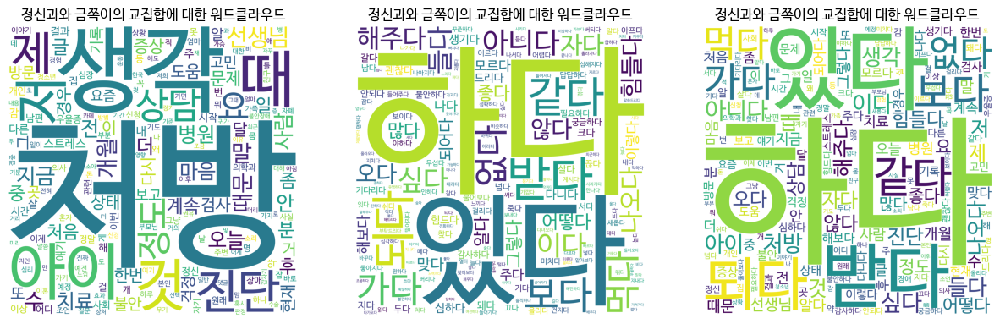

In [ ]:
wordclouds_maker('정신과와 금쪽이의 교집합', int_n_c, int_a_c, int_m_c)

In [48]:
# 차집합 구하기
def make_difference(df1, df2, keyword1, keyword2, i):
  re_n_words, re_p_words, re_m_words = okts_return_lists(df1, 'description', keyword1)
  n_words, p_words, m_words = okts_return_lists(df2, 'description', keyword2)

  dif_n_words = get_difference(re_n_words, n_words)
  dif_p_words = get_difference(re_p_words, p_words)
  dif_m_words = get_difference(re_m_words, m_words)

  dif_n_c = Counter(dif_n_words)
  dif_p_c = Counter(dif_p_words)
  dif_m_c = Counter(dif_m_words)

  temp = sorted(dif_n_c.items(), key = lambda x: x[1], reverse = True)
  dif_n_c = dict(temp[i:])

  temp = sorted(dif_p_c.items(), key = lambda x: x[1], reverse = True)
  dif_p_c = dict(temp[i:])

  temp = sorted(dif_m_c.items(), key = lambda x: x[1], reverse = True)
  dif_m_c = dict(temp[i:])

  return dif_n_c, dif_p_c, dif_m_c

In [49]:
# 차집합 구하기 : difference / 기준 : 카페글(정신과)
noun_dif = cafe_noun_keys - news_noun_keys
adjverb_dif = cafe_adjverb_keys - news_adjverb_keys
morph_dif = cafe_morph_keys - news_morph_keys

In [50]:
# 기준 : 뉴스
noun_dif2 = news_noun_keys - cafe_noun_keys
adjverb_dif2 = news_adjverb_keys - cafe_noun_keys
morph_dif2 = news_morph_keys - cafe_noun_keys

In [51]:
cafe_n_dif_words = []
cafe_a_dif_words = []
cafe_m_dif_words = []

cafe_n_dif_words = [x for x in cafe_nouns_lst if x in list(noun_dif)]
cafe_a_dif_words = [x for x in cafe_adjverb_lst if x in list(adjverb_dif)]
cafe_m_dif_words = [x for x in cafe_morph_lst if x in list(morph_dif)]

In [52]:
news_n_dif_words = []
news_a_dif_words = []
news_m_dif_words = []

news_n_dif_words = [x for x in news_nouns_lst if x in list(noun_dif2)]
news_a_dif_words = [x for x in news_adjverb_lst if x in list(adjverb_dif2)]
news_m_dif_words  = [x for x in news_morph_lst if x in list(morph_dif2)]

In [53]:
cafe_n_dif_c = Counter(cafe_n_dif_words)
cafe_a_dif_c = Counter(cafe_a_dif_words)
cafe_m_dif_c = Counter(cafe_m_dif_words)

In [54]:
news_n_dif_c = Counter(news_n_dif_words)
news_a_dif_c = Counter(news_a_dif_words)
news_m_dif_c = Counter(news_m_dif_words)

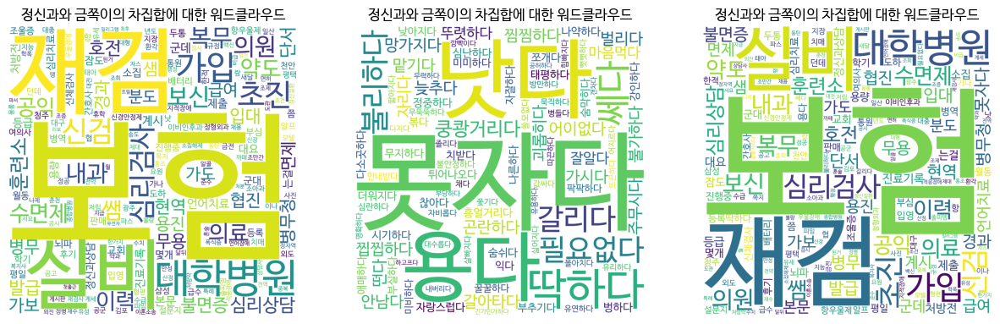

In [ ]:
wordclouds_maker('정신과와 금쪽이의 차집합', cafe_n_dif_c, cafe_a_dif_c, cafe_m_dif_c)

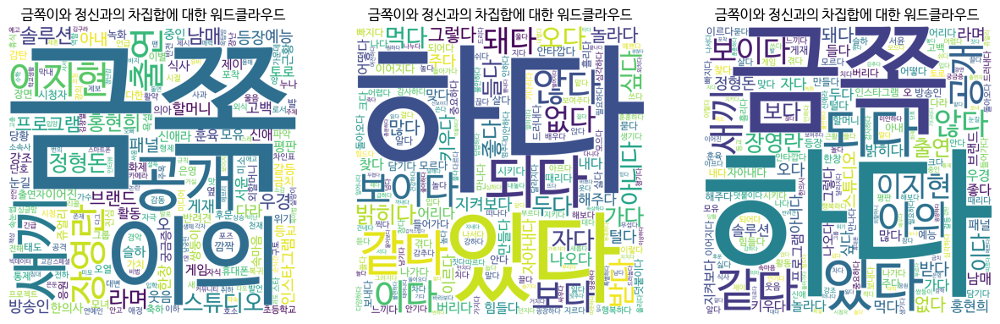

In [ ]:
wordclouds_maker('금쪽이와 정신과의 차집합', news_n_dif_c, news_a_dif_c, news_m_dif_c)

In [55]:
psy_df = psychiatry_df.copy()

psy_df['아이 여부'] = psy_df['description'].str.contains('아이')
psy_df['소아 여부'] = psy_df['description'].str.contains('소아')

psy_df

,title,description,link,아이 여부,소아 여부
0,심리상담센터후 정신과치료??,친구 사귀는것도 힘들어 보이구요 심리센터 상담했고 정신과에 한번 가볼려고 해요 혹시...,http://cafe.naver.com/009955/6868,True,False
1,정신과 다니는 분 계신가요 ㅜㅜ,수급자 재심사 때문에 다니는 정신과에서 근로능력평가 진단서랑 진료기록을 뗐어요 그 ...,http://cafe.naver.com/cafe1535/1120544,False,False
2,정신과 보험가입 알아보려고요,저희 동생이 주기적으로 정신과 병원가서 약을 타먹는데 한참을 기다려야 겨우 의사선생...,http://cafe.naver.com/uccplus/2091880,False,False
3,정신과 치료 4년차인 대학(휴학)생입니다,"부모님께 정신과를 가고 싶다고 말씀드렸지만, 부모님이 보험 가입 거절과 취업 시 불...",http://cafe.naver.com/koreanmania/643861,False,False
4,정신과 약 먹어도 될까요?,수술병원 비뇨기과에서 정신과 협진으로 우울증 약 “멀타핀정75밀리그램(미르타자핀)”...,http://cafe.naver.com/tlswkd/378578,False,False
...,...,...,...,...,...
995,정신과 재검 급수예측 부탁드립니다,정신과치료는 2016년때부터 받고 있고 사회복무하다가 증상이 심해져서 재검 받으러 ...,http://cafe.naver.com/webcenter/891378,False,False
996,어른이 갈만한 정신과잇을까요?,저희 엄마가 공황장애 증상이잇으신것같은데 이번에는 실신까지 하셔서 아무래도 정신과가...,http://cafe.naver.com/06rkddkwl/1903522,False,False
997,초등학생 정신과?,오늘 좀 어이없는 일을 겪어서 아이가 정신적으로 충격먹는 일이 발생하여 아이가 문밖...,http://cafe.naver.com/kunsanbeauty/1076389,True,False
998,우울증약 잘듣는 정신과 찾고있어요,제가 지금 너무 위태로운거 같아요 도움받을곳도 없고 안좋은생각만 끈임없이해서요 작년...,http://cafe.naver.com/byungs94/7329025,False,False


In [56]:
psy_df[(psy_df['아이 여부'] == True) | (psy_df['소아 여부'] == True)]

,title,description,link,아이 여부,소아 여부
0,심리상담센터후 정신과치료??,친구 사귀는것도 힘들어 보이구요 심리센터 상담했고 정신과에 한번 가볼려고 해요 혹시...,http://cafe.naver.com/009955/6868,True,False
21,"공황발작이 자꾸 생기는데, 정신과치료는 받기싫고ㅠ 스스로 나으신분 계실까요??",다시 공황장애가 시작되엇어요 정신과약은 아이학폭 이후부터먹기시작했고 증세가 괜찮아질...,http://cafe.naver.com/uvacenter/677326,True,False
30,즤 여동생이 정신과 전공의인데요,동생이 정신과 레지던트4년차예요 동생이 대학병원에있는데 교수님들한테 물어봤다네요 자...,http://cafe.naver.com/getampethskin/959255,True,False
31,소아정신과 진료전에 보험 정비 해야하나요?,아이 이것저것 검사해보려고 소아정신과진료보려해요 까페에 이것저것 검색해보는데 보험정...,http://cafe.naver.com/lol2580/1691167,True,True
33,정신과,친구 괴롭힘으로 힘들어하는 아이에요 아이가 쉬는 시간 전화가 왔네요 힘들다고 조퇴하...,http://cafe.naver.com/jookjeonmom/1373244,True,False
...,...,...,...,...,...
946,감정조절 안되는 애아빠 정신과랑 상담치료 받으면 나아질까요???,달라질까요ㅜ 정신과 상담 치료도 하라하고픈데 집나가서 없네요 같이 죽을힘을다해 노력...,http://cafe.naver.com/getampethskin/910083,True,False
957,자폐 아이를 많이 본 서울내 소아정신과 있을까요,정신과 약물 치료 중입니다 두드러기 올라오는것도 같고 저희가 다니는곳은 대기실에 보...,http://cafe.naver.com/getampethskin/833325,True,True
963,많이 우울하신 분들 정신과 진료와 상담 꼭 받으세요,"많이 우울하신 분들 정신과 진료와 상담 꼭 받으세요 처음에는 상담받다가 부부 상담,...",http://cafe.naver.com/1msanbu/2923011,True,False
985,좋은 정신과는 어떻게 찾으면될까요?,아이둘 맘인데 주위에서 우울증이니 정신과 가보라고 해서 가려는데 어떻게찾아야할지요 ...,http://cafe.naver.com/isajime/5214117,True,False


In [57]:
df = psy_df[(psy_df['아이 여부'] == True) | (psy_df['소아 여부'] == True)]
df

,title,description,link,아이 여부,소아 여부
0,심리상담센터후 정신과치료??,친구 사귀는것도 힘들어 보이구요 심리센터 상담했고 정신과에 한번 가볼려고 해요 혹시...,http://cafe.naver.com/009955/6868,True,False
21,"공황발작이 자꾸 생기는데, 정신과치료는 받기싫고ㅠ 스스로 나으신분 계실까요??",다시 공황장애가 시작되엇어요 정신과약은 아이학폭 이후부터먹기시작했고 증세가 괜찮아질...,http://cafe.naver.com/uvacenter/677326,True,False
30,즤 여동생이 정신과 전공의인데요,동생이 정신과 레지던트4년차예요 동생이 대학병원에있는데 교수님들한테 물어봤다네요 자...,http://cafe.naver.com/getampethskin/959255,True,False
31,소아정신과 진료전에 보험 정비 해야하나요?,아이 이것저것 검사해보려고 소아정신과진료보려해요 까페에 이것저것 검색해보는데 보험정...,http://cafe.naver.com/lol2580/1691167,True,True
33,정신과,친구 괴롭힘으로 힘들어하는 아이에요 아이가 쉬는 시간 전화가 왔네요 힘들다고 조퇴하...,http://cafe.naver.com/jookjeonmom/1373244,True,False
...,...,...,...,...,...
946,감정조절 안되는 애아빠 정신과랑 상담치료 받으면 나아질까요???,달라질까요ㅜ 정신과 상담 치료도 하라하고픈데 집나가서 없네요 같이 죽을힘을다해 노력...,http://cafe.naver.com/getampethskin/910083,True,False
957,자폐 아이를 많이 본 서울내 소아정신과 있을까요,정신과 약물 치료 중입니다 두드러기 올라오는것도 같고 저희가 다니는곳은 대기실에 보...,http://cafe.naver.com/getampethskin/833325,True,True
963,많이 우울하신 분들 정신과 진료와 상담 꼭 받으세요,"많이 우울하신 분들 정신과 진료와 상담 꼭 받으세요 처음에는 상담받다가 부부 상담,...",http://cafe.naver.com/1msanbu/2923011,True,False
985,좋은 정신과는 어떻게 찾으면될까요?,아이둘 맘인데 주위에서 우울증이니 정신과 가보라고 해서 가려는데 어떻게찾아야할지요 ...,http://cafe.naver.com/isajime/5214117,True,False


In [58]:
kids_psy_df = df.copy()
kids_psy_df['pos'] = kids_psy_df['description'].apply(lambda x: okt.pos(x, stem=True))

In [ ]:
import pickle
with open('kids_psy_pos.pkl', 'wb') as f:
  pickle.dump(kids_psy_df['pos'], f)

In [59]:
import pickle
with open('kids_psy_pos.pkl', 'rb') as f:
  kids_psy_pos = pickle.load(f)

In [80]:
kids_nouns_lst = []
kids_adjverb_lst = []
kids_morph_lst = []

for pos in kids_psy_pos.tolist():
  nouns = [x[0] for x in pos if x[1]=='Noun' and len(x[0]) > 1]
  adjverb = [x[0] for x in pos if x[1] in ['Adjective','Verb'] and len(x[0]) > 1]
  morphs = [x[0] for x in pos if x[1] in ['Noun', 'Adjective', 'Verb'] and len(x[0]) > 1]

  kids_nouns_lst.extend(nouns)
  kids_adjverb_lst.extend(adjverb)
  kids_morph_lst.extend(morphs)

In [81]:
kids_noun_keys = set(kids_nouns_lst)
kids_adjverb_keys = set(kids_adjverb_lst)
kids_morph_keys = set(kids_morph_lst)

In [82]:
# 교집합 구하기 : intersection
noun_int2 = kids_noun_keys & news_noun_keys
adjverb_int2 = kids_adjverb_keys & news_adjverb_keys
morph_int2 = kids_morph_keys & news_morph_keys

In [83]:
kids_n_words = []
kids_a_words = []
kids_m_words = []

kids_n_words = [x for x in kids_nouns_lst if x in list(noun_int2)]
kids_a_words = [x for x in kids_adjverb_lst if x in list(adjverb_int2)]
kids_m_words = [x for x in kids_morph_lst if x in list(morph_int2)]

In [84]:
news_n_words = []
news_a_words = []
news_m_words = []

news_n_words = [x for x in news_nouns_lst if x in list(noun_int2)]
news_a_words = [x for x in news_adjverb_lst if x in list(adjverb_int2)]
news_m_words = [x for x in news_morph_lst if x in list(morph_int2)]

In [85]:
kids_n_c = Counter(kids_n_words)
kids_a_c = Counter(kids_a_words)
kids_m_c = Counter(kids_m_words)

In [86]:
news_n_c = Counter(news_n_words)
news_a_c = Counter(news_a_words)
news_m_c = Counter(news_m_words)

In [87]:
int_n_c = get_intersection(kids_n_c, news_n_c)
int_a_c = get_intersection(kids_a_c, news_a_c)
int_m_c = get_intersection(kids_m_c, news_m_c)

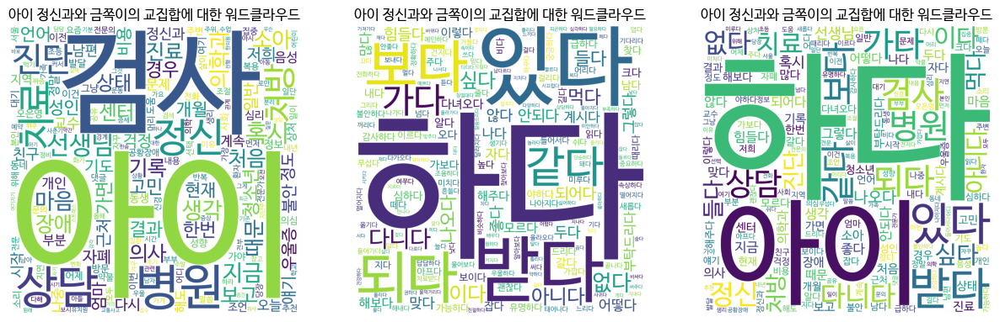

In [88]:
wordclouds_maker('아이 정신과와 금쪽이의 교집합', int_n_c, int_a_c, int_m_c)

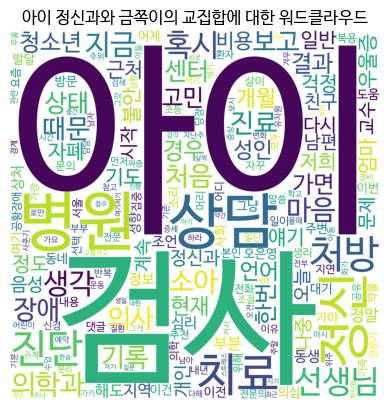

In [89]:
wordclouds_one_maker('아이 정신과와 금쪽이의 교집합', int_n_c)
plt.savefig('★ KidsPsychiatry_with_GoldenKids_nouns.jpg')

In [ ]:
kids_n_c = Counter(kids_nouns_lst)
kids_a_c = Counter(kids_adjverb_lst)
kids_m_c = Counter(kids_morph_lst)

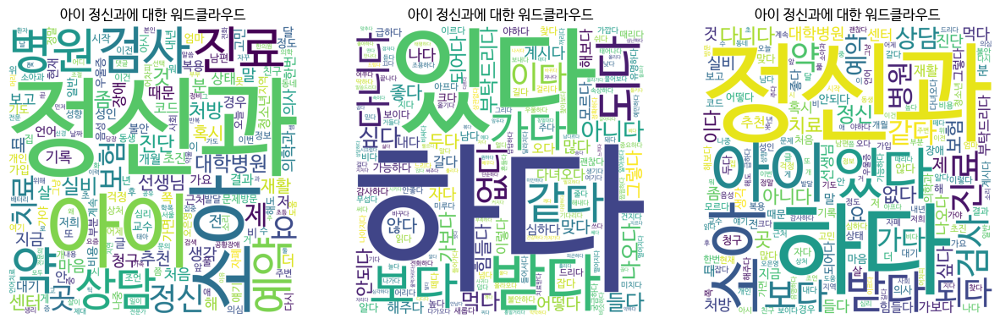

In [ ]:
wordclouds_maker('아이 정신과', kids_n_c, kids_a_c, kids_m_c)

In [ ]:
kids_dif_n_c = Counter(kids_nouns_lst) - Counter(news_n_words)
kids_dif_a_c = Counter(kids_adjverb_lst) - Counter(news_a_words)
kids_dif_m_c = Counter(kids_morph_lst) - Counter(news_m_words)

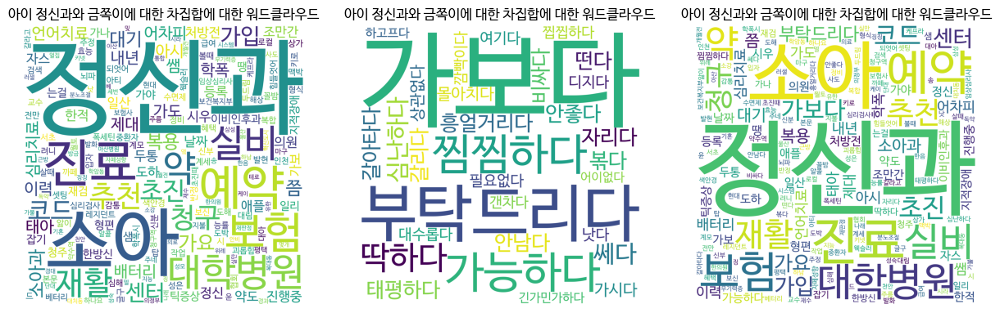

In [ ]:
wordclouds_maker('아이 정신과와 금쪽이에 대한 차집합', kids_dif_n_c, kids_dif_a_c, kids_dif_m_c)

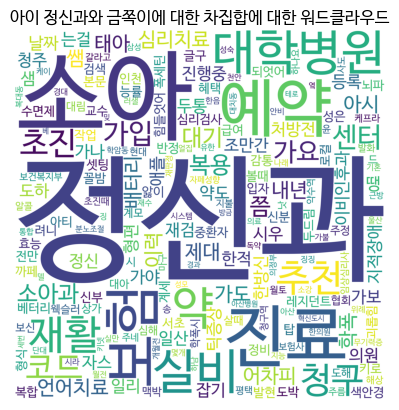

In [ ]:
wordclouds_one_maker('아이 정신과와 금쪽이에 대한 차집합', kids_dif_n_c)
plt.savefig('★ KidsPsychiatry_else_GoldenKids_nouns.jpg')

주목해야 할 키워드: 보험, 예약, 초진, 이력

차집합을 통해 현실적인 정신과와 관련한 이슈들을 확인할 수 있다고 생각했다.

#**정리**

파일 이름을 입력해주세요: GoldenKids_with_Psychiatry_20_nouns


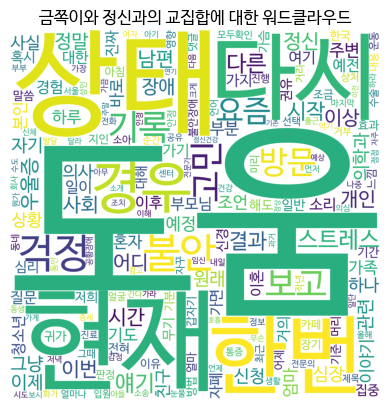

In [ ]:
int_n_c, int_p_c, int_m_c = make_intersection(golden_kids_df, psychiatry_df, '금쪽이', '정신과', 20)
wordclouds_one_maker('금쪽이와 정신과의 교집합', int_n_c)
save_jpgs(f_path)

주목 키워드 : 도움, 고민, 걱정, 불안, 이상, 조언

금쪽이와 정신과에 대한 교집합을 통해 프로그램에서 다룬 사연들과 사람들이 카페에 작성한 정신과에 대한 글들의 공통점을 확인할 수 있다고 생각했다.

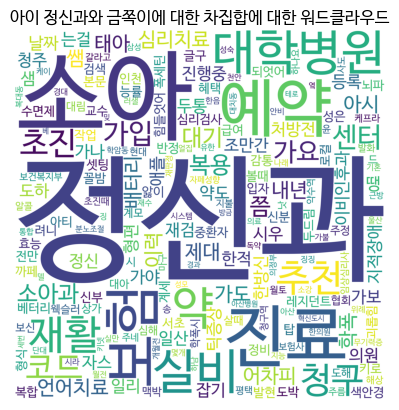

In [ ]:
wordclouds_one_maker('아이 정신과와 금쪽이에 대한 차집합', kids_dif_n_c)
plt.savefig('★ KidsPsychiatry_else_GoldenKids_nouns.jpg')

주목해야 할 키워드: 보험, 예약, 초진, 이력

차집합을 통해 현실적인 정신과와 관련한 이슈들을 확인할 수 있다고 생각했다.